# CSE4062 Data Science - Delivery #4

## Göksel Tokur - 150116049

## Arda Bayram-150116029

## Gülnihal Erdem - 150319554

## İrem Seçmen - 170219006

In [1]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

In [2]:
# Read Data
df = pd.read_csv('../data/training.1600000.processed.noemoticon.csv', header=None, encoding='latin')
df.columns = ['label', 'id', 'date', 'query', 'user', 'tweet']

# Data reduction
df = df.drop(['id', 'date', 'query', 'user'], axis=1)

In [3]:
labels_dict = {0:'Negative', 2:'Neutral', 4:'Positive'}

def convert_labels(label):
    return labels_dict[label]

df.label = df.label.apply(lambda x: convert_labels(x))
df

,label,tweet
0,Negative,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,Negative,is upset that he can't update his Facebook by ...
2,Negative,@Kenichan I dived many times for the ball. Man...
3,Negative,my whole body feels itchy and like its on fire
4,Negative,"@nationwideclass no, it's not behaving at all...."
...,...,...
1599995,Positive,Just woke up. Having no school is the best fee...
1599996,Positive,TheWDB.com - Very cool to hear old Walt interv...
1599997,Positive,Are you ready for your MoJo Makeover? Ask me f...
1599998,Positive,Happy 38th Birthday to my boo of alll time!!! ...


Text(0.5, 1.0, 'Data Distribution')

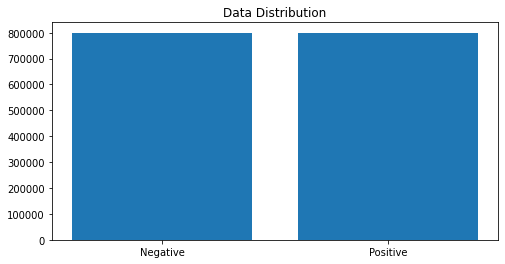

In [4]:
instances = df.label.value_counts()

plt.figure(figsize=(8,4))
plt.bar(instances.index, instances.values)
plt.title("Data Distribution")

## Preprocess

In [5]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer

stop_words = stopwords.words('english')
stemmer = SnowballStemmer('english')

punctuations_and_dummies = "@\S+|https?:\S+|http?:\S|[^A-Za-z0-9]+"



'''
def preprocess(df, will_be_stemmed=False):
    for index, row in df.iterrows():
        tweet = row.tweet
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        df.tweet = " ".join(tokens)


preprocess(df.tweet)
'''


def preprocess(tweet, will_be_stemmed=False):
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        return " ".join(tokens)
    
df.tweet = df.tweet.apply(lambda tw: preprocess(tw))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\gokse\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [6]:
# Remove 0 length tweets
df = df[df.iloc[:,1].astype(str).str.len()!=0]

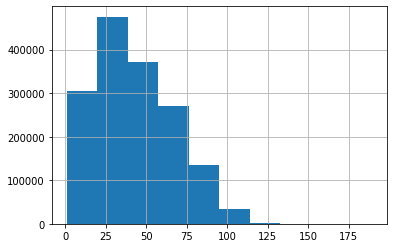

count    1.592328e+06
mean     4.279740e+01
std      2.415896e+01
min      1.000000e+00
25%      2.300000e+01
50%      3.900000e+01
75%      6.000000e+01
max      1.890000e+02
dtype: float64

In [7]:
tweets_len = [len(x) for x in df['tweet']]
pd.Series(tweets_len).hist()
plt.show()
pd.Series(tweets_len).describe()

### Number of Letters

In [8]:
all_str = ""
for i in df.tweet:
    all_str += i

In [9]:
from collections import Counter

letter_list = list(all_str)
my_counter = Counter(letter_list)

letter_df = pd.DataFrame.from_dict(my_counter, orient='index').reset_index()
letter_df = letter_df.rename(columns={'index':'letter', 0:'frequency'})
letter_df = letter_df.loc[letter_df['letter'].isin(['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z'])]
letter_df['all_tweets_relative_freq']=letter_df['frequency']/letter_df['frequency'].sum()
letter_df = letter_df.sort_values('letter')

english = pd.read_csv('../data/letter_frequency_en_US.csv')
english['expected_relative_frequency'] = english['count']/english['count'].sum()
english = english.drop(['count'], axis=1)

letter_df = pd.merge(letter_df, english, on='letter')
letter_df['expected'] = np.round(letter_df['expected_relative_frequency']*letter_df['frequency'].sum(),0)
letter_df = letter_df.reset_index().drop(['index'], axis=1)
letter_df

,letter,frequency,all_tweets_relative_freq,expected_relative_frequency,expected
0,a,4547601,0.078816,0.081238,4687379.0
1,b,975326,0.016904,0.014893,859300.0
2,c,1705409,0.029557,0.027114,1564464.0
3,d,2289515,0.039680,0.043192,2492128.0
4,e,6471295,0.112156,0.120195,6935169.0
5,f,878849,0.015232,0.023039,1329304.0
6,g,2231747,0.038679,0.020257,1168838.0
7,h,2234047,0.038719,0.059215,3416628.0
8,i,3779579,0.065505,0.073054,4215160.0
9,j,143817,0.002493,0.001031,59502.0


<AxesSubplot:ylabel='letter'>

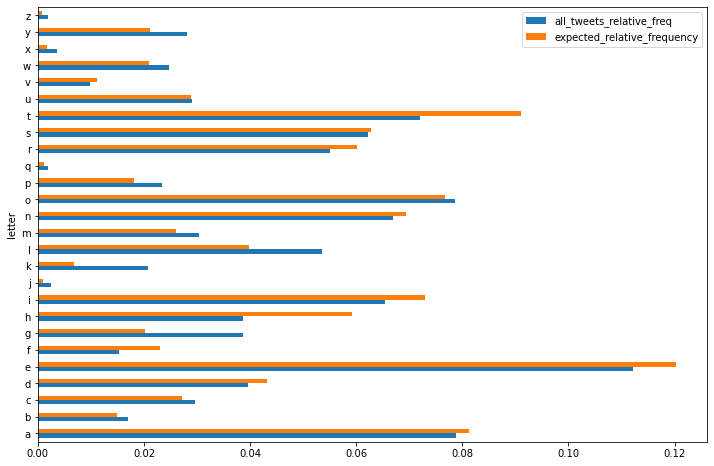

In [10]:
letter_df.plot(x="letter", y=["all_tweets_relative_freq", "expected_relative_frequency"], kind="barh", figsize=(12,8))

#### Compare the Observed Frequencies with the Expected Frequencies in English 

In [11]:
from scipy.stats import chi2_contingency
# Chi-square test of independence.
c, p, dof, expected = chi2_contingency(letter_df[['frequency', 'expected']])
p

0.0

We get that the p-value (p) is 0 which implies that the letter frequency does not follow the same distribution with what we see in English tests, although the Pearson correlation is too high (~96.7%).

In [12]:
letter_df[['frequency', 'expected']].corr()

,frequency,expected
frequency,1.000000,0.967421
expected,0.967421,1.000000


In [13]:
df1 = df.copy()

df1['number_of_characters'] = [len(tw) for tw in df1.tweet]
df1

,label,tweet,number_of_characters
0,Negative,awww bummer shoulda got david carr third day,44
1,Negative,upset update facebook texting might cry result...,69
2,Negative,dived many times ball managed save 50 rest go ...,52
3,Negative,whole body feels itchy like fire,32
4,Negative,behaving mad see,16
...,...,...,...
1599995,Positive,woke school best feeling ever,29
1599996,Positive,thewdb com cool hear old walt interviews,40
1599997,Positive,ready mojo makeover ask details,31
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52


In [14]:
df1.number_of_characters.max()

189

In [15]:
df1.number_of_characters.min()

1

In [16]:
df1.number_of_characters.mean()

42.7974010379771

In [17]:
df1.number_of_characters.std()

24.158961650697616

## Number of Words

In [18]:
df1['number_of_words'] = [len(tw.split()) for tw in df1.tweet]
df1

,label,tweet,number_of_characters,number_of_words
0,Negative,awww bummer shoulda got david carr third day,44,8
1,Negative,upset update facebook texting might cry result...,69,11
2,Negative,dived many times ball managed save 50 rest go ...,52,10
3,Negative,whole body feels itchy like fire,32,6
4,Negative,behaving mad see,16,3
...,...,...,...,...
1599995,Positive,woke school best feeling ever,29,5
1599996,Positive,thewdb com cool hear old walt interviews,40,7
1599997,Positive,ready mojo makeover ask details,31,5
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52,9


In [19]:
df1.number_of_words.max()

50

In [20]:
df1.number_of_words.min()

1

In [21]:
df1.number_of_words.mean()

7.244474128445898

In [22]:
df1.number_of_words.std()

4.030421805719796

### Positives + Negatives

<BarContainer object of 20 artists>

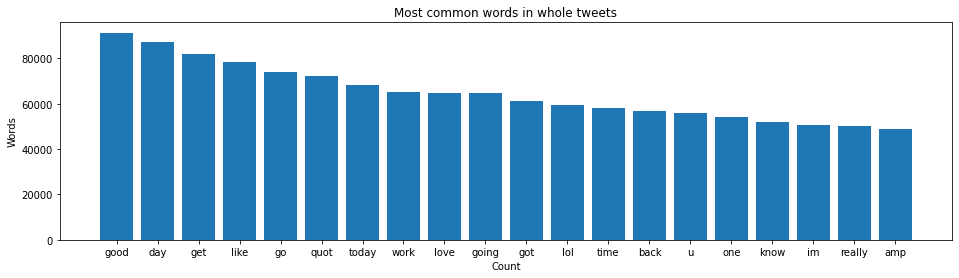

In [23]:
import collections
from wordcloud import WordCloud
from nltk import word_tokenize, sent_tokenize
from nltk.util import ngrams

all_tweets = ' '.join(df['tweet'].str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in whole tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

### Positives

<BarContainer object of 20 artists>

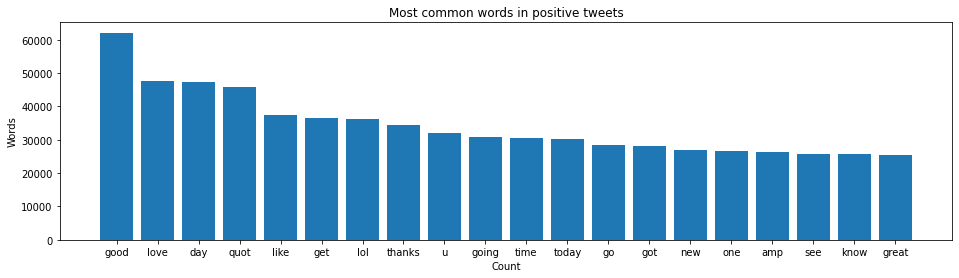

In [24]:
all_tweets = ' '.join(df[df.label == 'Positive'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in positive tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

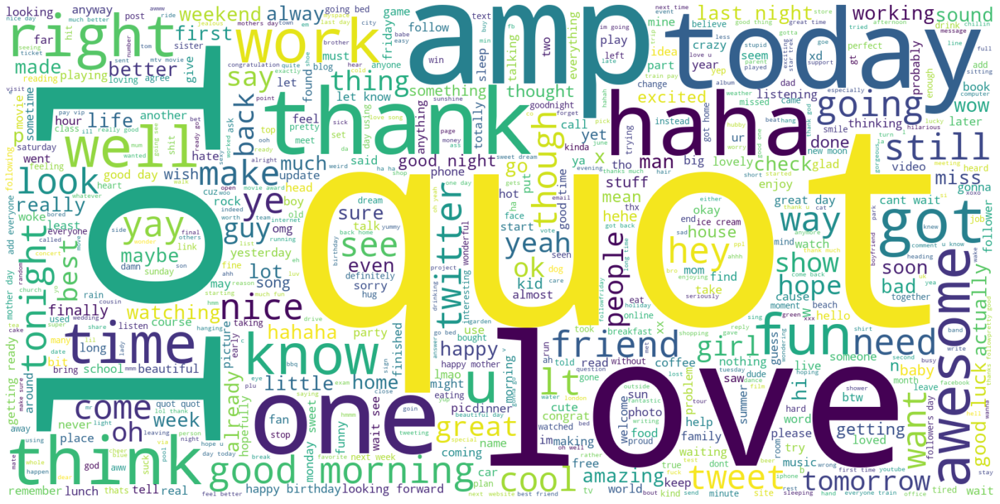

In [25]:
plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Positive'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Negatives

<BarContainer object of 20 artists>

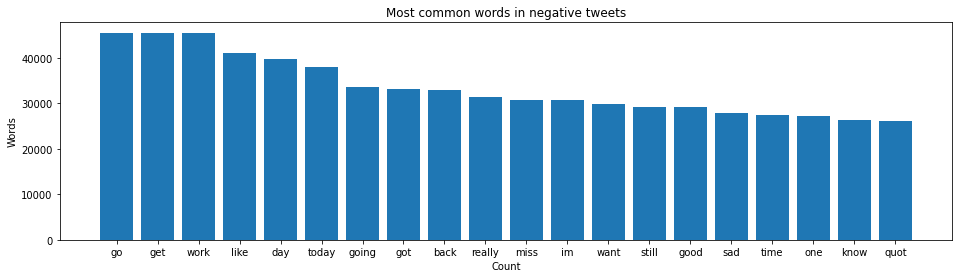

In [26]:
all_tweets = ' '.join(df[df.label == 'Negative'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in negative tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

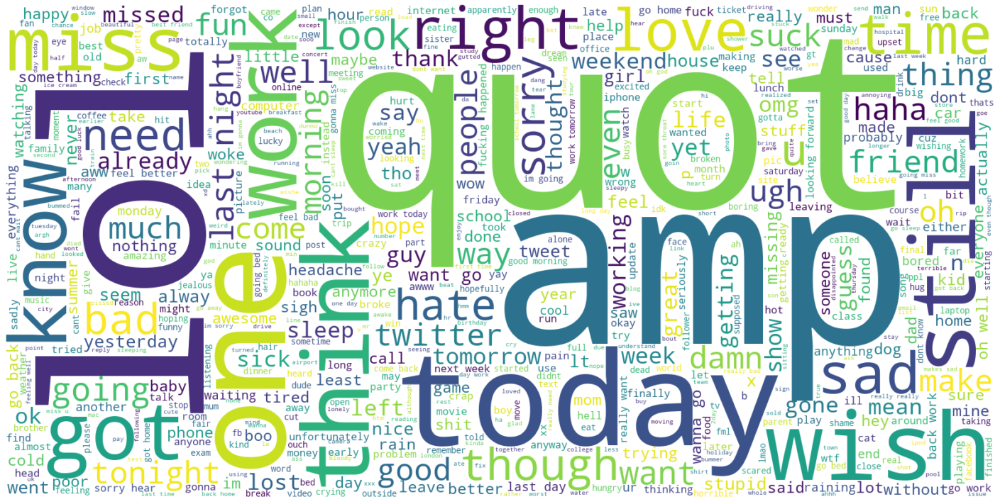

In [27]:
from wordcloud import WordCloud

plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Negative'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Training Data and Test Data Splitting

In [28]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(df, test_size=0.2, random_state=7)
print('Training Data', len(train_data), 'Test Data', len(test_data))

train_data.head(10)

Training Data 1273862 Test Data 318466


,label,tweet
927561,Positive,thank
810082,Positive,shakin money tree headed back car business
1153331,Positive,tasmania okay chat ya later
988182,Positive,yeah 100 tab storm towelled raiders awesome
543405,Negative,happy mari asleep gotta start laundry b4 wakes...
22855,Negative,wanting go city raining gotta homework 2
483675,Negative,sitting home bored x
667231,Negative,miss amy cards
1370823,Positive,dinner hubby two us 10 coupo
94439,Negative,know prob running around


In [29]:
test_data.head(10)

,label,tweet
1414233,Positive,nice job thanks
181653,Negative,way wanna shower n get pretty
788422,Negative,woke early think anyone completely bored
76646,Negative,lucky u scheduled today happy camper lol
972366,Positive,way cute curt hope school raised tons money lo...
797869,Negative,stupid braces making lips dry
1129919,Positive,good miss
1036078,Positive,past days sucked hopefully weekend happier
550532,Negative,marcus doubt megan fox good 2 years might get ...
1365388,Positive,going school contempt fash exams going conquer...


### Tokenization

In [30]:
from keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer()
tokenizer.fit_on_texts(train_data.tweet)
word_index = tokenizer.word_index
vocab_size = len(tokenizer.word_index) + 1
print("Vocabulary Size :", vocab_size)

Using TensorFlow backend.


Vocabulary Size : 290458


In [31]:
from keras.preprocessing.sequence import pad_sequences

X_train = pad_sequences(tokenizer.texts_to_sequences(train_data.tweet), maxlen = 30)
X_test = pad_sequences(tokenizer.texts_to_sequences(test_data.tweet), maxlen = 30)

print("X_train, X_test", X_train.shape, X_test.shape)

labels = train_data.label.unique().tolist()

X_train, X_test (1273862, 30) (318466, 30)


In [32]:
encoder = LabelEncoder()
encoder.fit(train_data.label.to_list())

y_train = encoder.transform(train_data.label.to_list())
y_test = encoder.transform(test_data.label.to_list())

y_train = y_train.reshape(-1,1)
y_test = y_test.reshape(-1,1)

print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

y_train shape: (1273862, 1)
y_test shape: (318466, 1)


### GLOVE Embedding

In [33]:
MODELS_PATH = '../models'
EMBEDDING_DIMENSION = 300

In [34]:
import tensorflow as tf

BATCH_SIZE = 1024
EPOCHS = 10
LR = 1e-3

embeddings_index = {}

glove_file = open('../glove/glove.6B.300d.txt', encoding='utf8')
for line in glove_file:
    values = line.split()
    word = value = values[0]
    coefficients = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefficients
glove_file.close()

print('%s word vectors.' % len(embeddings_index))


embedding_matrix = np.zeros((vocab_size, EMBEDDING_DIMENSION))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector
        
embedding_layer = tf.keras.layers.Embedding(vocab_size, EMBEDDING_DIMENSION, weights=[embedding_matrix], input_length=30, trainable=False)

400000 word vectors.


## Feature Extraction

### Bag of Words

In [35]:
from sklearn.feature_extraction.text import CountVectorizer

K = 20000
shuffled_df = df.sample(frac=1).reset_index(drop=True)
first_K_tweets = shuffled_df['tweet'].head(K)

vectorizer = CountVectorizer(stop_words='english')
vectorizer.fit(first_K_tweets)

# Dictionary
vectorizer.get_feature_names()

['00',
 '000',
 '000001',
 '006',
 '00am',
 '00pm',
 '01',
 '02',
 '03',
 '04',
 '0401',
 '05',
 '06',
 '0630',
 '07',
 '08',
 '09',
 '0n',
 '0x80070002',
 '10',
 '100',
 '1000',
 '10000',
 '1000s',
 '1000th',
 '100mb',
 '100monkeys',
 '100monkeysmusic',
 '100th',
 '100x',
 '101',
 '102',
 '103',
 '103f',
 '104',
 '105',
 '10am',
 '10day',
 '10dolla',
 '10gb',
 '10ish',
 '10k',
 '10lb',
 '10man06',
 '10min',
 '10mins',
 '10pm',
 '10pmish',
 '10pt',
 '10pts',
 '10th',
 '10yrs',
 '11',
 '110',
 '114',
 '1145',
 '115',
 '116',
 '118',
 '11am',
 '11days',
 '11pm',
 '11th',
 '12',
 '120',
 '12000',
 '12081',
 '120z',
 '122',
 '123',
 '1230',
 '123luvmiley',
 '125',
 '125th',
 '128mb',
 '12am',
 '12h',
 '12hr',
 '12hrs',
 '12pm',
 '12th',
 '13',
 '130',
 '13000',
 '133',
 '1337',
 '1347',
 '1349',
 '135',
 '13gigs',
 '13th',
 '14',
 '140',
 '140lovebird',
 '1411kbs',
 '145',
 '14gb',
 '14h',
 '14th',
 '14z',
 '15',
 '150',
 '1525',
 '154320',
 '155',
 '157',
 '15h',
 '15lbs',
 '15min',
 '15m

In [36]:
# Transform each tweets in vector space
vector = vectorizer.transform(first_K_tweets)
vector_spaces = vector.toarray()

vector_spaces

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [37]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

schools done summer officially gonna relax tonight chelada work computer client watch live twit tv
[0 0 0 ... 0 0 0]
eminem got ass cheeks face lmao going bath amp body spen giftcard
[0 0 0 ... 0 0 0]
wishing love handles prominent
[0 0 0 ... 0 0 0]
lol alright x
[0 0 0 ... 0 0 0]
ooh tawny astaw3eb math prep
[0 0 0 ... 0 0 0]
srry hear yeah things like plain wrong end story
[0 0 0 ... 0 0 0]
fff steakriot cause writes good content trust skinny chefs robot enthusiast besides cute
[0 0 0 ... 0 0 0]
heyy get invite spymaster
[0 0 0 ... 0 0 0]
lol gets addicting
[0 0 0 ... 0 0 0]
tan got noticed finally yay kheleia
[0 0 0 ... 0 0 0]
hate young
[0 0 0 ... 0 0 0]
feelin wrath alotta alcohol tummy
[0 0 0 ... 0 0 0]
wonderful news hoping
[0 0 0 ... 0 0 0]
last exam summer assigment due friday till 1st july going back va soon
[0 0 0 ... 0 0 0]
says place like home
[0 0 0 ... 0 0 0]
sean appreciate feedback hope left comment true busy writing 3rd act
[0 0 0 ... 0 0 0]
adiendo twitter mi gmail
[

traaace hoooow u
[0 0 0 ... 0 0 0]
awe poor david carradine
[0 0 0 ... 0 0 0]
clouds hanging tough southeast along coast clear skies tonight great conditions arietid meteor shower
[0 0 0 ... 0 0 0]
bad got paper due tomorrow otherwise could keep partitin night
[0 0 0 ... 0 0 0]
woken day feeling really rubbish
[0 0 0 ... 0 0 0]
sleepy fosho today ahh today missed buddys grad party hope hes mad
[0 0 0 ... 0 0 0]
aw im sorry 2 hear hope everything works 4 best ur mom family prayers
[0 0 0 ... 0 0 0]
watching john tucker must die movie hysterical
[0 0 0 ... 0 0 0]
love username way
[0 0 0 ... 0 0 0]
come way getting south end mum take busy crys
[0 0 0 ... 0 0 0]
aww think rach staying
[0 0 0 ... 0 0 0]
like remy
[0 0 0 ... 0 0 0]
annnything cba going tonight baha gonna
[0 0 0 ... 0 0 0]
going get bath nail model 9am
[0 0 0 ... 0 0 0]
thanks
[0 0 0 ... 0 0 0]
coffee reading paper going check tv see time golfing start great day everyone
[0 0 0 ... 0 0 0]
know
[0 0 0 ... 0 0 0]
packed 46 dis

[0 0 0 ... 0 0 0]
inoo confusing
[0 0 0 ... 0 0 0]
morning lovely weather today
[0 0 0 ... 0 0 0]
back woohoo wonder cause joes single ladies people flagged reason soooo glad back xx
[0 0 0 ... 0 0 0]
going movies loser yepitzriley lol
[0 0 0 ... 0 0 0]
work till 12
[0 0 0 ... 0 0 0]
yes yes almost cried tbh
[0 0 0 ... 0 0 0]
name claudia love much please send kisss
[0 0 0 ... 0 0 0]
cannot stand hills seem nice real life im glad would care read anyways xo
[0 0 0 ... 0 0 0]
urgh wanna longer
[0 0 0 ... 0 0 0]
want morning coffee coffee damnit stores near closed someone give cup need
[0 0 0 ... 0 0 0]
paparazzi respect tyson family stay away grieving time
[0 0 0 ... 0 0 0]
seems like aster family hope hope helps
[0 0 0 ... 0 0 0]
prop8 overturned
[0 0 0 ... 0 0 0]
thanks shout
[0 0 0 ... 0 0 0]
im waiting tbs like
[0 0 0 ... 0 0 0]
telll say hi lol
[0 0 0 ... 0 0 0]
ar 0 03 contracted hit collapsed smashed felt like week worht virus punch mobile
[0 0 0 ... 0 0 0]
meow hiya twitter wante

[0 0 0 ... 0 0 0]
oh fine
[0 0 0 ... 0 0 0]
mind chocked irritation slight pain n itching hand dunno wht n wht
[0 0 0 ... 0 0 0]
mel b meeting kind really disappointed much fun ok
[0 0 0 ... 0 0 0]
thought saw next examination table
[0 0 0 ... 0 0 0]
gotta make week beach
[0 0 0 ... 0 0 0]
ta mate get gran one waiting one mail
[0 0 0 ... 0 0 0]
want take towel head hair dry bleh thick hair
[0 0 0 ... 0 0 0]
aww thanks sweety lt 3 gonna sort mine hhe
[0 0 0 ... 0 0 0]
feel uncomfortable today clothes rubbing tooo hot
[0 0 0 ... 0 0 0]
given tile dns day heading dns food must remove tile adhesive hair first
[0 0 0 ... 0 0 0]
got kicked english class fault get bad report
[0 0 0 ... 0 0 0]
straight male enjoy euro pop said ashamed
[0 0 0 ... 0 0 0]
church service sweden today blast hanging swedish youth playing volleyball tourney team lost
[0 0 0 ... 0 0 0]
wtf skype stufed ipod touch
[0 0 0 ... 0 0 0]
yawn getting kinda tired gonna stay awake think gonna go back 2 bed tho haha
[0 0 0 ... 

maths revision cant teach x
[0 0 0 ... 0 0 0]
becca welch told msn kayleigh met bet lied
[0 0 0 ... 0 0 0]
everyone sleeping boring bcuz one posting super boring night usa
[0 0 0 ... 0 0 0]
morning weather like neck woods hungry great breakfast radisson
[0 0 0 ... 0 0 0]
miss long hair
[0 0 0 ... 0 0 0]
laying bed feeling like crap hates tiny netbook keyboard
[0 0 0 ... 0 0 0]
want go home
[0 0 0 ... 0 0 0]
hot water ran bath full realise got sad face
[0 0 0 ... 0 0 0]
felt really sleepy 2day sleep well last nite
[0 0 0 ... 0 0 0]
bad summer tour comming norway
[0 0 0 ... 0 0 0]
another version favorite picture hair puffy
[0 0 0 ... 0 0 0]
yes thanks odd
[0 0 0 ... 0 0 0]
thank know
[0 0 0 ... 0 0 0]
tripped grandmother cane got carpet burn
[0 0 0 ... 0 0 0]
one one turned loads
[0 0 0 ... 0 0 0]
go sub itsjeminelenaseries awesome
[0 0 0 ... 0 0 0]
fat chance suspect
[0 0 0 ... 0 0 0]
according good beach guide decent beaches get without car public transport fails
[0 0 0 ... 0 0 0]
cam

[0 0 0 ... 0 0 0]
angered weather report weekend rain starting 6pm friday night convenient
[0 0 0 ... 0 0 0]
ugh need car bad never ganna senior year
[0 0 0 ... 0 0 0]
finished piecing together first draft seating arrangements wedding bad
[0 0 0 ... 0 0 0]
going lubbock sad missing biting apple
[0 0 0 ... 0 0 0]
sunburn hit though burnt shoulder hurts
[0 0 0 ... 0 0 0]
great hear getting exposure another site
[0 0 0 ... 0 0 0]
right x hate u find someone u truly trusted seemed lil disappointed today
[0 0 0 ... 0 0 0]
lainey seriously make jealous want watch mtv movie awards right
[0 0 0 ... 0 0 0]
another beautiful desert morning valley forecast higher temps starting thursday enjoy 90s last
[0 0 0 ... 0 0 0]
gucke germanys next showstars aber auch nur zwangsweise tv pro7
[0 0 0 ... 0 0 0]
senior circle bye nfty
[0 0 0 ... 0 0 0]
song birthday sex dissapointing
[0 0 0 ... 0 0 0]
feel mean actually mam adored found videos youtube kept talking kind thing better
[0 0 0 ... 0 0 0]
right bb 

[0 0 0 ... 0 0 0]
haha miss
[0 0 0 ... 0 0 0]
lol like lt housework dh likes primitive cooking fire lt love primitive cooking
[0 0 0 ... 0 0 0]
movie sleep picking jake day lt 3
[0 0 0 ... 0 0 0]
hey saw tweets excellent stuff follow tweet
[0 0 0 ... 0 0 0]
quot tellllllllin youuuu goooooin quot lmao amazing much fun soooo quiet house
[0 0 0 ... 0 0 0]
recommended msbonnybrook mrtweet great mom
[0 0 0 ... 0 0 0]
maddisondesigns contribute mostly amusing conversation partly coffee
[0 0 0 ... 0 0 0]
pc intel core pc currently trying mac os 7 classic pc try ipc holidays
[0 0 0 ... 0 0 0]
followers
[0 0 0 ... 0 0 0]
susan boyle fantastic
[0 0 0 ... 0 0 0]
spending day chatting steve computer going work
[0 0 0 ... 0 0 0]
guys come camp lejeune please ok nice
[0 0 0 ... 0 0 0]
slept night huge amounts pain said shall try whine another beautiful day though
[0 0 0 ... 0 0 0]
um thanks yes hair kinda blinding guess lol
[0 0 0 ... 0 0 0]
haha would burnt hand oven hurts
[0 0 0 ... 0 0 0]
slept i

[0 0 0 ... 0 0 0]
make sure camp hill bottom one going rainy one apparently
[0 0 0 ... 0 0 0]
lol well put way go enjoy aruba ness
[0 0 0 ... 0 0 0]
outtwit working web tweeting today whack amp amp overly conspicuous
[0 0 0 ... 0 0 0]
hope u underdstand quot following quot u
[0 0 0 ... 0 0 0]
aww hiya sweetie thank missed
[0 0 0 ... 0 0 0]
stupid sleep apnea kicked last night suffocating sleep semi conscious
[0 0 0 ... 0 0 0]
love weston jordan lopez love dodgers
[0 0 0 ... 0 0 0]
cool going head 9 hopefully
[0 0 0 ... 0 0 0]
rolls eyes
[0 0 0 ... 0 0 0]
susan boyle really annoyin x via myleszizzeree tell sick old ass already
[0 0 0 ... 0 0 0]
unfortunatly im lazy get amp turn tv watch mtv awards tell happened jk
[0 0 0 ... 0 0 0]
hey miley please please reply honor
[0 0 0 ... 0 0 0]
misty craving diner dog btw hate guts go needs put pen
[0 0 0 ... 0 0 0]
fantasies amazing album shame wont get see reading day ticket sunday
[0 0 0 ... 0 0 0]
landed beautiful san diego
[0 0 0 ... 0 0 0]


[0 0 0 ... 0 0 0]
hey noticed quot save quot twitter searches useful feature stolen directly friendfeed
[0 0 0 ... 0 0 0]
watching heroes almost done season 2
[0 0 0 ... 0 0 0]
got back 311 pissed kelsey nothing new
[0 0 0 ... 0 0 0]
stoked life right
[0 0 0 ... 0 0 0]
oh send wrong links lol let send public ones
[0 0 0 ... 0 0 0]
rob pattinson
[0 0 0 ... 0 0 0]
hungry think going make lunch soon right twelve clock denmark p
[0 0 0 ... 0 0 0]
selling nearly every thing got less stuff travels guitars go bye bye
[0 0 0 ... 0 0 0]
thanks peeps followin much love
[0 0 0 ... 0 0 0]
going 2 days cannot destroy fix anything
[0 0 0 ... 0 0 0]
yeah push button one love convenience
[0 0 0 ... 0 0 0]
hey jonasbrothers u never answered questions last time anyway joe ur first kiss like never one yet jonasliveonfb
[0 0 0 ... 0 0 0]
lol x
[0 0 0 ... 0 0 0]
man wanted go cd signing badly cd signing ya coming back san diego
[0 0 0 ... 0 0 0]
fun vacation trip deserve
[0 0 0 ... 0 0 0]
didnt u leave mov

[0 0 0 ... 0 0 0]
enjoy mani pedi make look sexy like model cheerleader
[0 0 0 ... 0 0 0]
heard little celebration
[0 0 0 ... 0 0 0]
missfionalim yeah bagged big geek photographer could ask
[0 0 0 ... 0 0 0]
back school tomorrow
[0 0 0 ... 0 0 0]
hope okay lt 3
[0 0 0 ... 0 0 0]
first swim summer officially time scouting around hotel nice food
[0 0 0 ... 0 0 0]
uh 2morrow vacations end need 2 something school gt lt
[0 0 0 ... 0 0 0]
pizza sounds yummy back hurting sounds boo typing math hw
[0 0 0 ... 0 0 0]
sleeptime wonder whose gonna guess right neeed break fucking house someone cute sleep next
[0 0 0 ... 0 0 0]
uk x
[0 0 0 ... 0 0 0]
may give iphone cut monthly costs
[0 0 0 ... 0 0 0]
goin 2 rainy day wanna put rain boots says whiny voice
[0 0 0 ... 0 0 0]
dmed
[0 0 0 ... 0 0 0]
really miss sisters today reason
[0 0 0 ... 0 0 0]
yet bit chewy snickers bar
[0 0 0 ... 0 0 0]
course integral part process
[0 0 0 ... 0 0 0]
ok dark stormy clouds arrived leeds looks like bbq oh well
[0 0 

waiting london paddington train back reality mean cardiff
[0 0 0 ... 0 0 0]
thing let get use kicks much ass daily
[0 0 0 ... 0 0 0]
aww feelings brit know found must great
[0 0 0 ... 0 0 0]
smile shutter great
[0 0 0 ... 0 0 0]
biz markie quot nobody beats biz quot classic ishnit right ah memories
[0 0 0 ... 0 0 0]
heading beach
[0 0 0 ... 0 0 0]
tunafish toast dateline friday nite consists
[0 0 0 ... 0 0 0]
mornings sick joke god
[0 0 0 ... 0 0 0]
quot aint goin aint goin stopped cause twitter 4life quot bad boy baby
[0 0 0 ... 0 0 0]
dice want statpadders everythere servers
[0 0 0 ... 0 0 0]
wait see lilly allen neighbours
[0 0 0 ... 0 0 0]
reading mexican marketing company illustration magazine sunny outside
[0 0 0 ... 0 0 0]
says suggest ng names ng dogs oh mey 4 kming puppies 2 lalaki 2 babae
[0 0 0 ... 0 0 0]
missing old phone superior ability hold charge rip carlisle
[0 0 0 ... 0 0 0]
home waiting pizza oh friday night
[0 0 0 ... 0 0 0]
damn sounds tasty get tiger meat never se

[0 0 0 ... 0 0 0]
lookd first like wat amp said b day card quot smild amp said oh thank go
[0 0 0 ... 0 0 0]
poor poor milky ppw give cup tea soup lt 3
[0 0 0 ... 0 0 0]
ice coffee time reply email megseggs haha
[0 0 0 ... 0 0 0]
ready finals
[0 0 0 ... 0 0 0]
good morning today quite alot revision get done exams tuesday atleast last week school
[0 0 0 ... 0 0 0]
forgot brooke white bday eypey beydey
[0 0 0 ... 0 0 0]
yo weak fuccckk come followers yall need tell yo ppls fuckin follow ishsofuckingwavy lol
[0 0 0 ... 0 0 0]
mtv movie awards helping mom cook hamburgers
[0 0 0 ... 0 0 0]
miss myyyyyy bae angie p00h much love night
[0 0 0 ... 0 0 0]
work 20 minutes already wants go home
[0 0 0 ... 0 0 0]
nicharry started fb group called facebook birthday reminders
[0 0 0 ... 0 0 0]
missed conando
[0 0 0 ... 0 0 0]
hate coffee truly wish liked lol
[0 0 0 ... 0 0 0]
help scout camp 1 adult group amp adult group free 8 30 3 00 3 days loves
[1 0 0 ... 0 0 0]
stand rude people guy must sad life

[0 0 0 ... 0 0 0]
feel much attitude elizabeth darcy pride amp prejudice hope get mr darcy
[0 0 0 ... 0 0 0]
maths boring int
[0 0 0 ... 0 0 0]
live feed going get fix oh man
[0 0 0 ... 0 0 0]
charv vommed next
[0 0 0 ... 0 0 0]
thank everyone said lovely things much love kiss kiss oh lets forget cuddles xxxxx
[0 0 0 ... 0 0 0]
lol damn awkward asians photobombing us
[0 0 0 ... 0 0 0]
5am future calling answer goin back bed tired frm workin still pain
[0 0 0 ... 0 0 0]
saw looking good
[0 0 0 ... 0 0 0]
lucky guys hope great night
[0 0 0 ... 0 0 0]
gonna baking realised one would eat
[0 0 0 ... 0 0 0]
awww beautiful pic
[0 0 0 ... 0 0 0]
asked one brenden irl ontd friends via questions wish ppl asked stuff like coco
[0 0 0 ... 0 0 0]
wow nap needed n feel good prolly late 4 class
[0 0 0 ... 0 0 0]
aww wikkid shame stock though
[0 0 0 ... 0 0 0]
holy crap hope guys ok mum bro hit deer cars sound like nice experience
[0 0 0 ... 0 0 0]
eating applesauce fork really fantastic idea
[0 0 0 .

[0 0 0 ... 0 0 0]
watching film called madhouse im scared shitless
[0 0 0 ... 0 0 0]
wish could
[0 0 0 ... 0 0 0]
100 speakers want go
[0 0 0 ... 0 0 0]
truly fun nite goin bed wearing smile
[0 0 0 ... 0 0 0]
happened right decided needed back music library got dad music
[0 0 0 ... 0 0 0]
follow people work new
[0 0 0 ... 0 0 0]
boredom begining take weathers nice tho
[0 0 0 ... 0 0 0]
great day far
[0 0 0 ... 0 0 0]
dog came check
[0 0 0 ... 0 0 0]
sorry rosa got username wrong way round
[0 0 0 ... 0 0 0]
ok right macbeth macdeath blerggggg
[0 0 0 ... 0 0 0]
misses love
[0 0 0 ... 0 0 0]
great day great food great people alhamdulilah
[0 0 0 ... 0 0 0]
haha looks like two fun wish got lube thrown want hear
[0 0 0 ... 0 0 0]
far good still watching
[0 0 0 ... 0 0 0]
haha indeed student time starts
[0 0 0 ... 0 0 0]
lil drink sun 2moro cant wait
[0 0 0 ... 0 0 0]
crashing night everyone
[0 0 0 ... 0 0 0]
wanna put papers tray tomorrow
[0 0 0 ... 0 0 0]
miss already tears b okay u guys b 

[0 0 0 ... 0 0 0]
sister h1n1 look good pitiful sick
[0 0 0 ... 0 0 0]
lol millz ok change excitement september definately sydney cuz
[0 0 0 ... 0 0 0]
winplace lotto plays really wins one gt
[0 0 0 ... 0 0 0]
agreeed believe summer going
[0 0 0 ... 0 0 0]
damn hot
[0 0 0 ... 0 0 0]
ur coming school
[0 0 0 ... 0 0 0]
tirrredd thats say
[0 0 0 ... 0 0 0]
well guess im going stornoway beat oh think already lolx
[0 0 0 ... 0 0 0]
wish bc old gryffindor one worn one
[0 0 0 ... 0 0 0]
musta missed giant shopping cart kansas
[0 0 0 ... 0 0 0]
rain comes
[0 0 0 ... 0 0 0]
bored work
[0 0 0 ... 0 0 0]
food shopping making hungry
[0 0 0 ... 0 0 0]
love show bad hbo anymore
[0 0 0 ... 0 0 0]
yeah
[0 0 0 ... 0 0 0]
aahh cuddy power truly sexy
[0 0 0 ... 0 0 0]
shakes head oh simone know programmers want anything shady antics
[0 0 0 ... 0 0 0]
could play mine would sound bad
[0 0 0 ... 0 0 0]
hope everything works okay cry rock forget
[0 0 0 ... 0 0 0]
coffee man
[0 0 0 ... 0 0 0]
want pinkberry
[

[0 0 0 ... 0 0 0]
mad 2 look im sorry plz tell tom plz plz plz
[0 0 0 ... 0 0 0]
lmao actualy seen one pissed
[0 0 0 ... 0 0 0]
oh lol tara thats weird lololol
[0 0 0 ... 0 0 0]
concur hope ruin kids lives precious
[0 0 0 ... 0 0 0]
seen yet
[0 0 0 ... 0 0 0]
deeeeee happened
[0 0 0 ... 0 0 0]
thank following
[0 0 0 ... 0 0 0]
afraid ld thousands milles
[0 0 0 ... 0 0 0]
suddenly felt pathetic craziness feeling got stop lmao
[0 0 0 ... 0 0 0]
gotta love johncmayer amp theellenshow video always makes smile
[0 0 0 ... 0 0 0]
awe home soon wanna leave
[0 0 0 ... 0 0 0]
met simon frm blue saw britney spears amp still learnin ropes work bedtime finally guna watch hangover 2mw wit sach p xx
[0 0 0 ... 0 0 0]
got home hawk nelson show santa ana great
[0 0 0 ... 0 0 0]
sleepy head okay maybe tell anybody
[0 0 0 ... 0 0 0]
made video caleb cameron brothers today
[0 0 0 ... 0 0 0]
said happen
[0 0 0 ... 0 0 0]
want watch today anybody want watch
[0 0 0 ... 0 0 0]
simple yet detailed ahhh think c

[0 0 0 ... 0 0 0]
got
[0 0 0 ... 0 0 0]
piginthepoke mad pirate148 crazy
[0 0 0 ... 0 0 0]
yeah super cute
[0 0 0 ... 0 0 0]
wow drake melissa hey thats life somethings dont work way u want cant help little happy
[0 0 0 ... 0 0 0]
omg cant believe sunday ended monday good day altogether im glad mom amp dad back
[0 0 0 ... 0 0 0]
get spam filter eating emails u try check spam
[0 0 0 ... 0 0 0]
finally parting ways one fave old bags falling apart
[0 0 0 ... 0 0 0]
um dad isnt home california
[0 0 0 ... 0 0 0]
gurl went get hair donri like look like dierrah green yelow orage n brown worse case dierreah
[0 0 0 ... 0 0 0]
quot anyone believes disappointed quot quiet time best way start day
[0 0 0 ... 0 0 0]
croissant bread rolls bacon eggs sausages
[0 0 0 ... 0 0 0]
bestie sleepover stayed 4 terribly slap happy walls
[0 0 0 ... 0 0 0]
check yes juliet kings
[0 0 0 ... 0 0 0]
surgery mom thurs squarespace
[0 0 0 ... 0 0 0]
ohhh robby ray say dang flabbit good times
[0 0 0 ... 0 0 0]
wow trea

[0 0 0 ... 0 0 0]
check new summer designs sam amp proud
[0 0 0 ... 0 0 0]
im point life everything seems unreachable nothing seems worthwhile
[0 0 0 ... 0 0 0]
started via email since met tog work 8 though never get listen show
[0 0 0 ... 0 0 0]
yay
[0 0 0 ... 0 0 0]
think someone might tad sleep deprived
[0 0 0 ... 0 0 0]
hmm 4 doughnuts fridge type shall definitely pet pooja day
[0 0 0 ... 0 0 0]
kris allen awesome despite everyone disagreement winning highly think deserve crowned winner
[0 0 0 ... 0 0 0]
2nd thoughts
[0 0 0 ... 0 0 0]
selly begging please replay make day please please love sooooooo much
[0 0 0 ... 0 0 0]
thank think need
[0 0 0 ... 0 0 0]
quot purchase ftsk whoa oh vs everyone feat selena gomez itunes
[0 0 0 ... 0 0 0]
going get old bricks make pizza oven
[0 0 0 ... 0 0 0]
dwelling past 2 years ago would one first people would tell news hear others
[0 0 0 ... 0 0 0]
mommy leaving today
[0 0 0 ... 0 0 0]
last show year going get ready post show blues awesome wish en

[0 0 0 ... 0 0 0]
chairmate vyaa something silly argued winner woot
[0 0 0 ... 0 0 0]
barely got home
[0 0 0 ... 0 0 0]
squeeze pulling mussels shell lovin squeeze mrsasoprano
[0 0 0 ... 0 0 0]
peoples hour half leaving eva airport gonna hard day
[0 0 0 ... 0 0 0]
got job
[0 0 0 ... 0 0 0]
touch andyfield r e ofsted looking learning platforms school inspected two weeks ago
[0 0 0 ... 0 0 0]
loool name guy singing britney spears songs one cuttie clothes
[0 0 0 ... 0 0 0]
yet cant find usb connector haha itouch pretty good
[0 0 0 ... 0 0 0]
gettin ready take hot bath head bed
[0 0 0 ... 0 0 0]
think failed exam ugh fml
[0 0 0 ... 0 0 0]
making brownie dessert yum
[0 0 0 ... 0 0 0]
last day middle school tomorrow earth science exam blah text
[0 0 0 ... 0 0 0]
worked need beer abs found working monday public holiday
[0 0 0 ... 0 0 0]
damn tutorial uploaded finally
[0 0 0 ... 0 0 0]
said women visual damn
[0 0 0 ... 0 0 0]
k text highlights
[0 0 0 ... 0 0 0]
nonsense quot alternative medici

uh oh twilight zone still place
[0 0 0 ... 0 0 0]
done playing dsi wanna eat snacks
[0 0 0 ... 0 0 0]
im sleeeeeeeep good remedys fall asleep need one
[0 0 0 ... 0 0 0]
yay thinking portland abq road trip xd
[0 0 0 ... 0 0 0]
option install plugin using url wp upload feature prob wordpress
[0 0 0 ... 0 0 0]
really want go see children collide wish friends liked
[0 0 0 ... 0 0 0]
soccer game got cancelled werent goal posts perfect weather
[0 0 0 ... 0 0 0]
rawr 14 37 know ta
[0 0 0 ... 0 0 0]
thanks heads shift click investigate cheers
[0 0 0 ... 0 0 0]
longer feel like quot walking death quot like quot crumpled chair head desk death quot
[0 0 0 ... 0 0 0]
still breakfast played cod getting ready go 4 dinner earsex prodigy
[0 0 0 ... 0 0 0]
shit missed post office today sorry could throw would dunno much weighs
[0 0 0 ... 0 0 0]
without
[0 0 0 ... 0 0 0]
laughin funny
[0 0 0 ... 0 0 0]
still needs toothbrush cold go outside
[0 0 0 ... 0 0 0]
heading edmond teach babies swim
[0 0 0 ... 0

reply
[0 0 0 ... 0 0 0]
stiff neck 2 days ouuuuuuuuuch
[0 0 0 ... 0 0 0]
aww man sucks
[0 0 0 ... 0 0 0]
good morning rg
[0 0 0 ... 0 0 0]
dontyouhate goolish lookin females double take shit madd scary son like wanna kidnap u somethin
[0 0 0 ... 0 0 0]
rhettroberts aw guys totally awesome bestbuddies
[0 0 0 ... 0 0 0]
gonna go stuf 2 lt 3 background wut guys reckon bout purple chucks ok cya guys twitterers luv mileycyrus amp jonasbrothers
[0 0 0 ... 0 0 0]
going doctors
[0 0 0 ... 0 0 0]
farrah fawcett died morning sad
[0 0 0 ... 0 0 0]
hi song suggestions
[0 0 0 ... 0 0 0]
thank
[0 0 0 ... 0 0 0]
loves little ben eastenders majorly camp dancing around girls aloud watch funny
[0 0 0 ... 0 0 0]
watched entire season ever hear song ff5 heard finale missed
[0 0 0 ... 0 0 0]
think babys getting sick hate kids get sick id rather get
[0 0 0 ... 0 0 0]
great night bllaahh back
[0 0 0 ... 0 0 0]
im bored think might choke im almost kern juice love stufff
[0 0 0 ... 0 0 0]
kind let oh wel
[0 0 

listening zie l mineswippering computer sitting couch spiritually high
[0 0 0 ... 0 0 0]
okay laundry
[0 0 0 ... 0 0 0]
desktop makes die happiness okay need shit leave exam ick ick ick ick outty xx
[0 0 0 ... 0 0 0]
hmm today nothing per wish car even better wish people would remember exsist haha
[0 0 0 ... 0 0 0]
sugary brown nowadays clouds coming closer sun time
[0 0 0 ... 0 0 0]
problems keep persisting film project trudging back work tomorrow
[0 0 0 ... 0 0 0]
crabby bit horse
[0 0 0 ... 0 0 0]
teasin last night totally understand human 2 hands folks really hasslin ya
[0 0 0 ... 0 0 0]
material flags made mine nylon 24 hrs later seing whole lot
[0 0 0 ... 0 0 0]
attending brand equity quiz taking part
[0 0 0 ... 0 0 0]
night hope get sleep exhausted lol sweet dreams
[0 0 0 ... 0 0 0]
2 slideshows friday grad video headache fever coughing feeling super dizzy dang good combo
[0 0 0 ... 0 0 0]
check chantalpaige new youtube video www youtube com increasingthepeace
[0 0 0 ... 0 0 0]


[0 0 0 ... 0 0 0]
english exam went really well think history paper 1 knowledge tomorrow
[0 0 0 ... 0 0 0]
sounds like bigger story case study always looking guest writers dan
[0 0 0 ... 0 0 0]
think im getting sick
[0 0 0 ... 0 0 0]
feel bad barely even tweet prince miss soo much
[0 0 0 ... 0 0 0]
sent direct message dm offered opportunity
[0 0 0 ... 0 0 0]
smh flirting sammie cutie tho well sexy
[0 0 0 ... 0 0 0]
great set pictures messed guess seattle stuff
[0 0 0 ... 0 0 0]
get pick music ceremony
[0 0 0 ... 0 0 0]
jealous yet meet pamelump mr emmett
[0 0 0 ... 0 0 0]
woo balloons confetti streamers remember 2nd cruise ok bikinis
[0 0 0 ... 0 0 0]
wish
[0 0 0 ... 0 0 0]
missed bay breakers going ocean beach
[0 0 0 ... 0 0 0]
went friends party today end school year srsly fun forever wrestle grass often
[0 0 0 ... 0 0 0]
registered created lot buzz preview developers attended meeting lets wait
[0 0 0 ... 0 0 0]
birthday girl w boo
[0 0 0 ... 0 0 0]
reaaaaaally sick hell want like
[0

[0 0 0 ... 0 0 0]
forget watch jay leno jayleno tonightshow
[0 0 0 ... 0 0 0]
nasty rainy day today
[0 0 0 ... 0 0 0]
things look ugly iran
[0 0 0 ... 0 0 0]
feel like tanning amp amp margaritas amp amp chips salsa todee
[0 0 0 ... 0 0 0]
homieee please move street far come back meeeeeeee
[0 0 0 ... 0 0 0]
went 2 3rd one grade7 dat unforgettable maddog dancing n everything seriously want parade dis year 2
[0 0 0 ... 0 0 0]
last day easter hols
[0 0 0 ... 0 0 0]
please vote 4 4 b96 summer bash hometown chitown finalist thanks
[0 0 0 ... 0 0 0]
show months back could get tickets wait years see
[0 0 0 ... 0 0 0]
would trust sieve called memory moment giving rebeccamezzino shout ur closer
[0 0 0 ... 0 0 0]
waiting turn wii fit gym closed
[0 0 0 ... 0 0 0]
click link says quot page unavailable quot
[0 0 0 ... 0 0 0]
anyway time go work still gprs weekend terrible without 3g
[0 0 0 ... 0 0 0]
bored today
[0 0 0 ... 0 0 0]
go suck penis like boys truuuust
[0 0 0 ... 0 0 0]
think squarespace c

[0 0 0 ... 0 0 0]
yes cd apartment
[0 0 0 ... 0 0 0]
old feel keep telling anyway
[0 0 0 ... 0 0 0]
thanks heard yet missed barcampbham year maybe make hsvtweetup thanks 4 heads
[0 0 0 ... 0 0 0]
sigh deers cars mix believe shit happened
[0 0 0 ... 0 0 0]
qualitativ sind normale vom sound viel besser
[0 0 0 ... 0 0 0]
yes follow anywhere
[0 0 0 ... 0 0 0]
startin work today
[0 0 0 ... 0 0 0]
whoh day shut part hydraulics assignment time
[0 0 0 ... 0 0 0]
bbq tomorrow see invited
[0 0 0 ... 0 0 0]
bored guys also read
[0 0 0 ... 0 0 0]
know know get
[0 0 0 ... 0 0 0]
quot change way look things things look change quot wayne dyer
[0 0 0 ... 0 0 0]
nah jus messin wit thats like askin color like red blue say green lol
[0 0 0 ... 0 0 0]
yummmmmmm 1 u 2 look great w mickey nuggets
[0 0 0 ... 0 0 0]
likes kittens omg lt 3 lt 3 lol wanna cat lady simpsons lowkey
[0 0 0 ... 0 0 0]
camping
[0 0 0 ... 0 0 0]
totally hahha listenin right noww
[0 0 0 ... 0 0 0]
gah sneezing nose whole day stupid fl

[0 0 0 ... 0 0 0]
thanks much follow simply adore beautiful creative jewelry
[0 0 0 ... 0 0 0]
thanks man feels great encouraged everyone needs even thanks 4 sharing love god awesome dion levy
[0 0 0 ... 0 0 0]
iphone finally back normal got sync music videos urgh
[0 0 0 ... 0 0 0]
hour later eating cheeto puffs chocolate milk good idea
[0 0 0 ... 0 0 0]
alright babes gt lt boo im gonna leave agaiiiiin
[0 0 0 ... 0 0 0]
gotta stop stayin til 4am gotta work morning feel like shit
[0 0 0 ... 0 0 0]
unless come blackberry messenger ont iphone
[0 0 0 ... 0 0 0]
eatin heart lol cause eat much school days 4 days left
[0 0 0 ... 0 0 0]
know kind day going dead kitten middle road soon get
[0 0 0 ... 0 0 0]
check review movie fighting hilarious leave guy comment
[0 0 0 ... 0 0 0]
starting morning routine get kids ready get em school back work website morning cup kicking yet
[0 0 0 ... 0 0 0]
awesome rock let hope mondays also rock
[0 0 0 ... 0 0 0]
heard u sing solo sad
[0 0 0 ... 0 0 0]
aww im

[0 0 0 ... 0 0 0]
certainly nice view although respectable one quite say quot best band quot
[0 0 0 ... 0 0 0]
seeing potential free traffic might need check pulse
[0 0 0 ... 0 0 0]
working balancing assassination engine place think soon think problem
[0 0 0 ... 0 0 0]
brother xx
[0 0 0 ... 0 0 0]
got lots meds take
[0 0 0 ... 0 0 0]
oh wait courteney cox new show cougar town love
[0 0 0 ... 0 0 0]
studying uni count hate life atm
[0 0 0 ... 0 0 0]
maybe selling stores fans like demand create buzz
[0 0 0 ... 0 0 0]
migraineeeesssss suck feel ill wishing head would fall
[0 0 0 ... 0 0 0]
regretting putting back bottle mango boone farm
[0 0 0 ... 0 0 0]
put two weeks notice tomorrow scared like disappoint people advice peanut gallery
[0 0 0 ... 0 0 0]
trying dress brown orange
[0 0 0 ... 0 0 0]
head feels like bowling ball
[0 0 0 ... 0 0 0]
dreary rainy crappy day
[0 0 0 ... 0 0 0]
keep tweets
[0 0 0 ... 0 0 0]
yet sleeping hahaha u2we na ako m2ya sa amin hahaha apir
[0 0 0 ... 0 0 0]
ok

[0 0 0 ... 0 0 0]
would love see girls bad none cairns oh well
[0 0 0 ... 0 0 0]
said earlier mum al lie actually dropped slab finger
[0 0 0 ... 0 0 0]
knowing father credit card number wonders
[0 0 0 ... 0 0 0]
awesome wtfbbq afternoon weather looks great good times
[0 0 0 ... 0 0 0]
carors hahahaha wonderfulmiles thats fotolog mine iheartmiles charmingjoe
[0 0 0 ... 0 0 0]
away home long duty matters xd
[0 0 0 ... 0 0 0]
home made tacos w cheap cheese ortega hard shells store soft corn still good
[0 0 0 ... 0 0 0]
quot 13 13 quot lt part win quote paste due quot quot words
[0 0 0 ... 0 0 0]
lexiibettinger heyyy said hi awhile lol hiiiiii
[0 0 0 ... 0 0 0]
gym bad swim sauna
[0 0 0 ... 0 0 0]
zelda arrive today doubt posted yesterday seems
[0 0 0 ... 0 0 0]
bloody sleep
[0 0 0 ... 0 0 0]
excited 4 friday wooooohh
[0 0 0 ... 0 0 0]
happy birthday hope great day
[0 0 0 ... 0 0 0]
super tired really wants go bed much h w omg uni drains life
[0 0 0 ... 0 0 0]
everything going well entrenc

[0 0 0 ... 0 0 0]
confused going cry two seconds haaa
[0 0 0 ... 0 0 0]
something tonight reuben leaves us
[0 0 0 ... 0 0 0]
looking forward evening poker
[0 0 0 ... 0 0 0]
woah woah woah anyone go fabric absolute dope lineup 26th june anyone going dm
[0 0 0 ... 0 0 0]
landed atlanta lost back phone flight find wtf lame
[0 0 0 ... 0 0 0]
talking honey boo
[0 0 0 ... 0 0 0]
gettin amp busy mourning first stop doctors office
[0 0 0 ... 0 0 0]
hahaha gay need see fratellis
[0 0 0 ... 0 0 0]
want
[0 0 0 ... 0 0 0]
guy woman know nosey haha amp ur mean u tell love
[0 0 0 ... 0 0 0]
monday morning good mood something must wrong
[0 0 0 ... 0 0 0]
watched natalee holloway lifetime really sad
[0 0 0 ... 0 0 0]
actually pretty cool like u go
[0 0 0 ... 0 0 0]
cool river pizza mom sis
[0 0 0 ... 0 0 0]
everything scares days
[0 0 0 ... 0 0 0]
wait go rooooaadddtrrrriiippp question century california ny need help
[0 0 0 ... 0 0 0]
new yt video yarrrr mcdonalds live without thank another sweet vid 

let switch places even minute make hour pleeeeeeeease
[0 0 0 ... 0 0 0]
home home last two months summer break ahead
[0 0 0 ... 0 0 0]
ever walk room people talking bout ever happened like thousand people
[0 0 0 ... 0 0 0]
wait ages since copy arrive amazing amazing love
[0 0 0 ... 0 0 0]
new moon trailer amazing thing world cannot wait see
[0 0 0 ... 0 0 0]
says got insurance laptop charger broke back college nearly finished though j
[0 0 0 ... 0 0 0]
know happy surprised week nice neighbor found took care
[0 0 0 ... 0 0 0]
wanted david letterman play edward guess didnt happen still love baby davey lt 33
[0 0 0 ... 0 0 0]
hey howz shooting u follow plesee thanks
[0 0 0 ... 0 0 0]
boat
[0 0 0 ... 0 0 0]
bummer
[0 0 0 ... 0 0 0]
love kitties missing two right okay
[0 0 0 ... 0 0 0]
aww could use justin hug miss ya need come visit sometime prob called job
[0 0 0 ... 0 0 0]
someone give like live commentary fighting spiders
[0 0 0 ... 0 0 0]
icednyior big screen powerful laptop heavy shor

[0 0 0 ... 0 0 0]
summer lt 3 gonna miss bdrm hate sbs
[0 0 0 ... 0 0 0]
eeergh sick bout hun
[0 0 0 ... 0 0 0]
thewordisyou llbe harper ferry onthe8thhereinboston ilookforwardtotheperformance hope pull waynebows
[0 0 0 ... 0 0 0]
sooo bored wish andrew would come decided procrastinate homework cant come cuddle
[0 0 0 ... 0 0 0]
let tell petersantilli quite possibly retweetable person twitter believe followfriday
[0 0 0 ... 0 0 0]
listening music playing around computer hope life gets better soon
[0 0 0 ... 0 0 0]
im going bed horrible tummy ache
[0 0 0 ... 0 0 0]
fjdkls got zero computers one using go back couple weeks
[0 0 0 ... 0 0 0]
love feeling feel life total 10 10
[0 0 0 ... 0 0 0]
also shout inside novel website skywalker like www heathfox com
[0 0 0 ... 0 0 0]
sleep even taking nyquil hiccups
[0 0 0 ... 0 0 0]
worst headache ever past two days much sun
[0 0 0 ... 0 0 0]
thanks recommendation
[0 0 0 ... 0 0 0]
class
[0 0 0 ... 0 0 0]
slept
[0 0 0 ... 0 0 0]
last day convention

fair want twitpic toooooo
[0 0 0 ... 0 0 0]
thank might brave give go
[0 0 0 ... 0 0 0]
e fink beach pic wow nice lucky b beaches nearby quite walking distance shabbat
[0 0 0 ... 0 0 0]
roadtrip rad fun stopped shops got copy twilight finished watching
[0 0 0 ... 0 0 0]
oh gosh loved performance quot fever quot def looked good alright voice beautiful ever
[0 0 0 ... 0 0 0]
na thats miilion dolla hollas mixtape
[0 0 0 ... 0 0 0]
sound like richer avocado
[0 0 0 ... 0 0 0]
going austin next weekend think
[0 0 0 ... 0 0 0]
want haarp live wembley dvd back
[0 0 0 ... 0 0 0]
indianna jones marathon watched every movie yes even lame 4rth except temple doom maybe tomorrow night tweets
[0 0 0 ... 0 0 0]
working sun day headache feel like crap
[0 0 0 ... 0 0 0]
thanks much 140lovebird cool
[0 0 0 ... 0 0 0]
new pc arrived today runs windows 7 like cut cat reinstall everything
[0 0 0 ... 0 0 0]
totally trust military secrets likely forget lol
[0 0 0 ... 0 0 0]
back dc soon ready go back work tom

[0 0 0 ... 0 0 0]
tank two course
[0 0 0 ... 0 0 0]
blacklight sundays moscow
[0 0 0 ... 0 0 0]
damn previews long startrek vegas
[0 0 0 ... 0 0 0]
cleaning room gonna take hours gab
[0 0 0 ... 0 0 0]
say whore jus piece art thats getting painted white hahahah
[0 0 0 ... 0 0 0]
whole lot new haha
[0 0 0 ... 0 0 0]
still working website done 5 pages
[0 0 0 ... 0 0 0]
dont wanna work today stupid 3 hour meaningless shift im making like 30 bucks thankgod im giving 2 weeks notice today
[0 0 0 ... 0 0 0]
morning m8 lol nothing like bit politeness dude
[0 0 0 ... 0 0 0]
zomg real firefox 3 5 new icon like
[0 0 0 ... 0 0 0]
twitter friends
[0 0 0 ... 0 0 0]
missing best friend listening radio disney
[0 0 0 ... 0 0 0]
bowwow614 see yall
[0 0 0 ... 0 0 0]
oh hoping go back hospital
[0 0 0 ... 0 0 0]
anuva fing lol like wen calls shauny
[0 0 0 ... 0 0 0]
yeah gt
[0 0 0 ... 0 0 0]
definatelyyyyyyy amazinggggg
[0 0 0 ... 0 0 0]
found cool blogger template site keeps timing really want new layout b

[0 0 0 ... 0 0 0]
yes would welcome change doubt cheaper
[0 0 0 ... 0 0 0]
new emails
[0 0 0 ... 0 0 0]
49ers move santa clara life know
[0 0 0 ... 0 0 0]
gud mornin gotz stomach acherz
[0 0 0 ... 0 0 0]
ok break back books fun lovelies
[0 0 0 ... 0 0 0]
second andrew suggestion might fit emergency chin thinking
[0 0 0 ... 0 0 0]
dodgeball big kids bad sit
[0 0 0 ... 0 0 0]
thinking con law fighting headache amp paying bills
[0 0 0 ... 0 0 0]
sigh etsy sales soooo slow right
[0 0 0 ... 0 0 0]
yes usual steel cut oatmeal blueberries
[0 0 0 ... 0 0 0]
mom cancelled game night
[0 0 0 ... 0 0 0]
waiting mama anggi sency wondering around clueless
[0 0 0 ... 0 0 0]
watching brother street fighter better
[0 0 0 ... 0 0 0]
love snapped wish many runs though
[0 0 0 ... 0 0 0]
matter long work homework list seems get bigger smaller like anticipated
[0 0 0 ... 0 0 0]
headache
[0 0 0 ... 0 0 0]
come show 3rd st promenade santa monica tomorrow sat 2 30pm front apple store
[0 0 0 ... 0 0 0]
go
[0 0 

### tf-idf

In [38]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words='english')

# Learn vocabulary from tweets 
vectorizer.fit(first_K_tweets)

# Vocabulary
vectorizer.vocabulary_

{'schools': 16436,
 'summer': 18189,
 'officially': 13433,
 'gonna': 8021,
 'relax': 15592,
 'tonight': 19214,
 'chelada': 3695,
 'work': 21054,
 'computer': 4289,
 'client': 4000,
 'watch': 20535,
 'live': 11186,
 'twit': 19662,
 'tv': 19594,
 'eminem': 6288,
 'got': 8096,
 'ass': 1557,
 'cheeks': 3671,
 'face': 6739,
 'lmao': 11218,
 'going': 8001,
 'bath': 2044,
 'amp': 1156,
 'body': 2606,
 'spen': 17632,
 'giftcard': 7854,
 'wishing': 20926,
 'love': 11393,
 'handles': 8505,
 'prominent': 14945,
 'lol': 11274,
 'alright': 1081,
 'ooh': 13581,
 'tawny': 18588,
 'astaw3eb': 1582,
 'math': 11830,
 'prep': 14798,
 'srry': 17763,
 'hear': 8681,
 'yeah': 21314,
 'things': 18900,
 'like': 11092,
 'plain': 14443,
 'wrong': 21150,
 'end': 6332,
 'story': 17995,
 'fff': 6973,
 'steakriot': 17871,
 'cause': 3469,
 'writes': 21143,
 'good': 8027,
 'content': 4421,
 'trust': 19494,
 'skinny': 17130,
 'chefs': 3692,
 'robot': 15965,
 'enthusiast': 6395,
 'cute': 4868,
 'heyy': 8823,
 'invite': 

In [39]:
# Transform to document by term matrix
vector_spaces = vectorizer.transform(first_K_tweets)
vector_spaces.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [40]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

schools done summer officially gonna relax tonight chelada work computer client watch live twit tv
  (0, 21054)	0.16019835629530352
  (0, 20535)	0.2122666985670324
  (0, 19662)	0.3143579865549177
  (0, 19594)	0.2449247610738188
  (0, 19214)	0.19371147803758051
  (0, 18189)	0.2234356786489112
  (0, 16436)	0.3282209114049724
  (0, 15592)	0.29811782131383174
  (0, 13433)	0.2882269021312485
  (0, 11186)	0.2247585928383414
  (0, 8021)	0.1974348160677146
  (0, 4289)	0.254861682929482
  (0, 4000)	0.3173755314723284
  (0, 3695)	0.3849234048106919
eminem got ass cheeks face lmao going bath amp body spen giftcard
  (0, 17632)	0.37711859518364693
  (0, 11218)	0.26454987872599217
  (0, 8096)	0.16246178934079727
  (0, 8001)	0.16146023821790187
  (0, 7854)	0.39271365867165847
  (0, 6739)	0.2565207178672502
  (0, 6288)	0.3445296900922875
  (0, 3671)	0.35747113878202597
  (0, 2606)	0.2794641782640204
  (0, 2044)	0.3004854292405888
  (0, 1557)	0.26126051128664873
  (0, 1156)	0.17935911355578896
wishing

  (0, 20757)	0.3515626837223973
  (0, 19331)	0.3276963403051147
  (0, 18148)	0.20577454126405986
  (0, 17980)	0.2129623568065241
  (0, 17620)	0.3515626837223973
  (0, 17510)	0.1780194499523579
  (0, 10786)	0.3515626837223973
  (0, 4008)	0.3515626837223973
  (0, 3587)	0.28711306203157216
  (0, 1941)	0.28711306203157216
  (0, 35)	0.3376017677939537
lol really really answer
  (0, 15399)	0.7110727421023446
  (0, 11274)	0.3454703843069923
  (0, 1274)	0.6123934756395037
lol need 2 something though eating bad past weeks nothing fried food
  (0, 20655)	0.35977951826156845
  (0, 14013)	0.4149599318298223
  (0, 12894)	0.26584949079061004
  (0, 11274)	0.239970188989507
  (0, 7477)	0.5017119874343987
  (0, 7283)	0.3425625715883541
  (0, 6076)	0.35079607582424066
  (0, 1870)	0.2792550612892983
ill kill allowed ask stuff like
  (0, 18083)	0.3694100729017915
  (0, 11092)	0.24312334573208622
  (0, 10458)	0.46415470672806924
  (0, 9380)	0.40026401625406527
  (0, 1540)	0.42865230508969765
  (0, 1059)	0.

  (0, 910)	0.27957794770911304
aw im sorry 2 hear hope everything works 4 best ur mom family prayers
  (0, 21070)	0.34277009258686386
  (0, 20012)	0.2900756237325279
  (0, 17510)	0.2512534637009375
  (0, 14764)	0.4230963728795945
  (0, 12418)	0.2980352115189969
  (0, 9399)	0.21686632170263712
  (0, 9049)	0.23810588413681208
  (0, 8681)	0.2918559145305189
  (0, 6806)	0.3060786345832258
  (0, 2273)	0.27540103318270187
  (0, 1732)	0.33009970774166936
watching john tucker must die movie hysterical
  (0, 20541)	0.2678093023489781
  (0, 19540)	0.5231587249823976
  (0, 12550)	0.29993021440309336
  (0, 10100)	0.4199193720373546
  (0, 9283)	0.48764333506679214
  (0, 5437)	0.38793903037842226
love username way
  (0, 20577)	0.47907319680566623
  (0, 20044)	0.7863426443731185
  (0, 11393)	0.3900693755509275
come way getting south end mum take busy crys
  (0, 20577)	0.26304043755023493
  (0, 17543)	0.4030501880627548
  (0, 12637)	0.36750208216870656
  (0, 7823)	0.2694806793141001
  (0, 6332)	0.3267

  (0, 20577)	0.2934244630363971
  (0, 17991)	0.46169565375790456
  (0, 15251)	0.5317066946339896
  (0, 11063)	0.32153400927987125
  (0, 9227)	0.5609305478850946
finally got pause userid something worth adding cpan
  (0, 21094)	0.33277754967583206
  (0, 20043)	0.4659215559248241
  (0, 14059)	0.4342917943657247
  (0, 8096)	0.19274717850158138
  (0, 7047)	0.2743944163169189
  (0, 4616)	0.4659215559248241
  (0, 775)	0.3924795239261629
think one
  (0, 18902)	1.0
went support looks like dealing w bug problem guess keep trying
  (0, 20699)	0.28583344762285245
  (0, 19506)	0.29037383175877063
  (0, 18269)	0.38013841103345813
  (0, 14895)	0.3472939957618838
  (0, 11312)	0.28740709400874953
  (0, 11092)	0.19697847696077514
  (0, 8327)	0.28645684695368584
  (0, 5117)	0.43835211781259975
  (0, 3071)	0.4162336898722708
awww sick poor youuu x
  (0, 21448)	0.6271868527333162
  (0, 16966)	0.4094690514956479
  (0, 14630)	0.462257667711195
  (0, 1780)	0.47464681213291476
goooood morning nice sunny monda

  (0, 1829)	0.47954386538959604
ohh must enter tj contest thanks valeriexefronas reminder
  (0, 20099)	0.4402990310406946
  (0, 19103)	0.4228143034505841
  (0, 18823)	0.19565033039179214
  (0, 15634)	0.4402990310406946
  (0, 13450)	0.35341108500003526
  (0, 6384)	0.3862765792906012
  (0, 4422)	0.34801371932020203
ahhhhhhhhh im sick flu think swine flu normal flu think
  (0, 18902)	0.3177615653566726
  (0, 18398)	0.28610718101045607
  (0, 16966)	0.1908349751943259
  (0, 13207)	0.2704899742603375
  (0, 9399)	0.15166116070409846
  (0, 7214)	0.7615580317549975
  (0, 919)	0.3234435209227264
next week
  (0, 20647)	1.0
get much sleep early work
  (0, 21054)	0.4734588073484439
  (0, 17182)	0.5718089173579416
  (0, 6047)	0.6699785965044911
need txt buddies ladies dm number want new txting buddy
  (0, 20484)	0.19672646377551964
  (0, 19714)	0.4046545204249169
  (0, 19712)	0.34845605361474663
  (0, 13312)	0.3284724208137148
  (0, 12987)	0.2003969646259481
  (0, 12894)	0.2052852370257683
  (0, 107

  (0, 17600)	0.3956064296861399
  (0, 15412)	0.3133568475890351
  (0, 11630)	0.4639502499336598
  (0, 10789)	0.41403037151558253
  (0, 4219)	0.37889737180965777
  (0, 4213)	0.3510384983383134
  (0, 2528)	0.3030524875814857
amazing day falconry aunty yesterday
  (0, 21379)	0.3698198676451712
  (0, 6789)	0.6060314142613457
  (0, 5071)	0.23581750067268709
  (0, 1675)	0.5648900914642889
  (0, 1113)	0.34820752629036583
going drama banquet tonight wannabe ghs red carpet awards night iron curl hair
  (0, 20481)	0.3433939278170309
  (0, 19214)	0.17995822733731065
  (0, 15482)	0.2509672914197097
  (0, 13070)	0.16171821492186367
  (0, 9753)	0.301227675735679
  (0, 8454)	0.22350541058794823
  (0, 8001)	0.14702129806385916
  (0, 7841)	0.35759436814031004
  (0, 5819)	0.28476692891588556
  (0, 4839)	0.3333185550655019
  (0, 3404)	0.30904274199069365
  (0, 1977)	0.3433939278170309
  (0, 1742)	0.25447247386861893
revising alex whoopp bio xxx
  (0, 21231)	0.3686774708061901
  (0, 20810)	0.5336924407602

  (0, 18905)	0.22607667191666508
  (0, 18788)	0.2436631986709445
  (0, 18495)	0.347344416195766
  (0, 16389)	0.24005749545679483
  (0, 16247)	0.347344416195766
  (0, 13123)	0.36170822188437546
  (0, 13070)	0.16357866112351874
  (0, 12842)	0.36170822188437546
  (0, 11541)	0.25141037376946884
  (0, 11227)	0.29539868693578936
  (0, 10787)	0.29539868693578936
  (0, 8924)	0.25385448099379115
im sorry able reply im quot personal quot business lol text u 2morrow morning k
  (0, 18788)	0.28609701948858784
  (0, 17510)	0.21505347111324358
  (0, 15683)	0.284637401762131
  (0, 15198)	0.4113823262311508
  (0, 14217)	0.34088996018438766
  (0, 12497)	0.2027856045617313
  (0, 11274)	0.1812781147895097
  (0, 9399)	0.3712414910643832
  (0, 3158)	0.31644106968724106
  (0, 633)	0.2780211317220291
  (0, 244)	0.34088996018438766
neither super dupe busy got 300 vms smh gotta go return calls tired dude
  (0, 20314)	0.384515983936003
  (0, 19074)	0.21108857509423803
  (0, 18244)	0.2534149770532305
  (0, 17264

  (0, 21063)	0.2740872849359195
  (0, 20541)	0.25892300424383796
  (0, 20232)	0.31560181195044346
  (0, 13447)	0.2300510446612068
  (0, 12558)	0.36401262991006134
  (0, 9139)	0.5057995655143646
  (0, 3443)	0.45137680613875514
  (0, 1732)	0.3364931424637112
sounds good
  (0, 17533)	0.8434040433491311
  (0, 8027)	0.5372798336642992
pink rubyrose1 still trying really hard 2 get u follow
  (0, 19506)	0.34408200759415725
  (0, 16123)	0.5920753085327453
  (0, 15399)	0.26008407745795786
  (0, 14383)	0.4504496387977099
  (0, 8551)	0.36464976564718
  (0, 7255)	0.35712231104922726
going 4 hour cycling trip soon
  (0, 19460)	0.442097766819925
  (0, 17472)	0.3663287041004735
  (0, 9119)	0.4102846950389248
  (0, 8001)	0.2788684799714891
  (0, 4899)	0.6513460562712502
lost essendon boys still played well though
  (0, 14482)	0.4908876945086249
  (0, 11367)	0.390980232128938
  (0, 6486)	0.632663843664039
  (0, 2786)	0.4537622619661678
watching lost finalle well sis wanted done chili bex
  (0, 20541)	0

  (0, 1358)	0.4351776316470333
sunburn hit though burnt shoulder hurts
  (0, 18215)	0.47896262847166543
  (0, 16909)	0.5235037993617307
  (0, 9248)	0.3625205490747844
  (0, 8907)	0.3856879450833838
  (0, 3145)	0.46514753906391865
great hear getting exposure another site
  (0, 17088)	0.43935849819927975
  (0, 8681)	0.3893886299166483
  (0, 8214)	0.317836646212336
  (0, 7823)	0.3406876759412522
  (0, 6684)	0.6620063283216798
right x hate u find someone u truly trusted seemed lil disappointed today
  (0, 19495)	0.5325021361669657
  (0, 19491)	0.43225592017266745
  (0, 19138)	0.22577205930863758
  (0, 15887)	0.2705684958161232
  (0, 11101)	0.3808039648960851
  (0, 8600)	0.2994887519385579
  (0, 5522)	0.4131716211725372
lainey seriously make jealous want watch mtv movie awards right
  (0, 20535)	0.26578463890037013
  (0, 20484)	0.21840850182943036
  (0, 16652)	0.32384327605726587
  (0, 15887)	0.2351690390032756
  (0, 12602)	0.35574172257615194
  (0, 12550)	0.2763179357692751
  (0, 11621)	0.

thats thinkin goonz never come jersey ima look think theres lake suttin local
  (0, 18904)	0.30432729683714416
  (0, 18902)	0.1706209922868656
  (0, 18877)	0.30432729683714416
  (0, 18832)	0.2217229581333176
  (0, 18327)	0.372641078915051
  (0, 11303)	0.2134042897306362
  (0, 11240)	0.30432729683714416
  (0, 10756)	0.29453666418069807
  (0, 10019)	0.3269199137827787
  (0, 9401)	0.30162263289219393
  (0, 8063)	0.372641078915051
  (0, 4186)	0.1897716219944672
getting things done errands italia soo soon
  (0, 18900)	0.33535856017639265
  (0, 17472)	0.309443687658676
  (0, 17471)	0.3750736537251248
  (0, 9799)	0.5502023820094382
  (0, 7823)	0.2948592848864613
  (0, 6455)	0.5113064986026352
hi tom please greet friend yves happy birthday bet greeting make bday super special
  (0, 21494)	0.38143645049848157
  (0, 19176)	0.284206013725837
  (0, 18244)	0.2513854128010094
  (0, 17606)	0.28561590465299475
  (0, 11621)	0.1902400982925485
  (0, 8832)	0.24006792201270297
  (0, 8545)	0.19114578326873

  (0, 21054)	0.3955350184501123
  (0, 18816)	0.5032277318842331
  (0, 13483)	0.5217368755619419
  (0, 7975)	0.564007563531893
see dad amp nonna day
  (0, 13177)	0.7507134566115088
  (0, 5071)	0.2921158324362646
  (0, 4921)	0.48326189202493863
  (0, 1156)	0.342863807099765
carnival cultures today might look later people drink caipirinhas spare booze moment
  (0, 19138)	0.15767462175199767
  (0, 17582)	0.3455984644406322
  (0, 14172)	0.2089840665304139
  (0, 12419)	0.2651794928940046
  (0, 11303)	0.22178053836842992
  (0, 10820)	0.22694889658515305
  (0, 5867)	0.26917568684167303
  (0, 4818)	0.3872674687293701
  (0, 3392)	0.3718886790480936
  (0, 3236)	0.3872674687293701
  (0, 2700)	0.36097725412190873
gorgeous day today son finally gets play first game today job interview today gonna good day
  (0, 19138)	0.4963172926534781
  (0, 17449)	0.3027599621930672
  (0, 14475)	0.24649989644435982
  (0, 10079)	0.24871138276995278
  (0, 9670)	0.3074473163487454
  (0, 8088)	0.2913112187445206
  (0,

  (0, 19574)	0.31386345834226953
  (0, 19429)	0.3601903650487517
  (0, 19257)	0.38857547327607145
  (0, 16903)	0.4557046458712792
  (0, 13070)	0.4121750700110978
  (0, 8096)	0.18852054300729454
  (0, 7336)	0.4557046458712792
work mode today pain creeping becoming numb
  (0, 21054)	0.22722610647600255
  (0, 19138)	0.22229273577740652
  (0, 13869)	0.3614970168310363
  (0, 13310)	0.5459771784761058
  (0, 12382)	0.4419241017401501
  (0, 4693)	0.5242958629085738
cold nothing seems working today like supposed let see fix something
  (0, 21063)	0.3563407028951666
  (0, 19138)	0.26773538701588423
  (0, 18275)	0.45426632489990565
  (0, 11092)	0.2592395796475603
  (0, 11008)	0.3710875682272385
  (0, 7101)	0.4770421479534091
  (0, 4123)	0.4031139022520994
tryed get erlie get london ticket seems solded tho haha im relly angery xd
  (0, 21194)	0.2576479539728991
  (0, 19504)	0.3683228651691295
  (0, 19002)	0.28350091024277235
  (0, 18924)	0.22867572179729287
  (0, 17412)	0.3683228651691295
  (0, 15

  (0, 20484)	0.5232118901767076
  (0, 16728)	0.8522026273004073
june 20th
  (0, 10223)	0.570738993815494
  (0, 182)	0.8211315369284494
tamb acho
  (0, 18515)	0.7071067811865476
  (0, 712)	0.7071067811865476
hangover far one funniest movies ever seen entire life holla steph vic good times
  (0, 20212)	0.36982880854037964
  (0, 19043)	0.2387149649977018
  (0, 17887)	0.35056114185764264
  (0, 16567)	0.2484170711466185
  (0, 12553)	0.26768473782935553
  (0, 11063)	0.21199155582723786
  (0, 8965)	0.34368421395515175
  (0, 8521)	0.2805440376283839
  (0, 8027)	0.14736144175083615
  (0, 7597)	0.36982880854037964
  (0, 6833)	0.24414246307588391
  (0, 6398)	0.30020666788810557
bored
  (0, 2710)	1.0
deserve go knock
  (0, 10572)	0.759157807033731
  (0, 5327)	0.6509066169733847
wakey time sooo tired usual
  (0, 20442)	0.6235999091505313
  (0, 20051)	0.47715393262923245
  (0, 19074)	0.35649581249720785
  (0, 19035)	0.2792265364222685
  (0, 17475)	0.42236306054564743
bring bank hol weekend
  (0, 206

  (0, 17472)	0.3917760528805962
  (0, 9049)	0.3480964048617154
  (0, 5172)	0.6603007053578972
  (0, 1781)	0.5379064935613928
shabtai great prizes today go almost half way page cgft
  (0, 20577)	0.23708780675698987
  (0, 19138)	0.19216347008577217
  (0, 16711)	0.4719761481934626
  (0, 14887)	0.45323348968547783
  (0, 13861)	0.339670673271553
  (0, 8471)	0.2986550089285948
  (0, 8214)	0.22660103025651693
  (0, 3551)	0.4719761481934626
chelsea spent last half hour making friends porceline good bleh
  (0, 17639)	0.3341681333047704
  (0, 14651)	0.464330308198538
  (0, 11633)	0.29021803872935237
  (0, 9119)	0.28086815534775195
  (0, 8471)	0.29381690763747864
  (0, 8027)	0.17766917953226052
  (0, 7482)	0.2639292234277601
  (0, 3697)	0.4012868334066029
  (0, 2481)	0.4012868334066029
talk p puff diddy daddy sean combs puffy ever feels need invent hes gay
  (0, 18504)	0.22101740924724594
  (0, 16517)	0.30048852377388413
  (0, 15047)	0.32847686100499207
  (0, 15045)	0.33840588165080376
  (0, 1289

  (0, 20577)	0.2023041500103054
  (0, 19149)	0.7066368267289728
  (0, 14630)	0.5000771356196949
  (0, 11179)	0.2178706149552251
  (0, 4717)	0.4027315229386058
datacard working rush office
  (0, 21063)	0.34106233286493415
  (0, 16160)	0.5616737257213493
  (0, 13429)	0.4148023443338489
  (0, 5031)	0.6293950477007031
talking perez go play traffic care nothing negativity say people 5
  (0, 19349)	0.3686431272247972
  (0, 18509)	0.31335783380366405
  (0, 16383)	0.2626391985680523
  (0, 14475)	0.29227259805300426
  (0, 14187)	0.44908396718384763
  (0, 14172)	0.25999254136936856
  (0, 12912)	0.4817910525727963
  (0, 3368)	0.3318302925565817
staying inside next days want dec tranq kill sleeping
  (0, 20484)	0.2152480497580002
  (0, 19372)	0.4749982569609641
  (0, 17866)	0.34319414848303054
  (0, 17186)	0.3234281288483519
  (0, 10458)	0.3574986648746069
  (0, 9598)	0.34319414848303054
  (0, 5147)	0.4427523103684282
  (0, 5080)	0.2530609167757537
said language two different language lol malay ye

  (0, 20921)	0.4127087227957587
  (0, 20602)	0.5007113151444903
  (0, 17511)	0.6763475102936138
  (0, 8096)	0.348588201656623
still working website alllmost finished
  (0, 21063)	0.3599390867789399
  (0, 20619)	0.5025761888140489
  (0, 7062)	0.4203086470299464
  (0, 1053)	0.6642301329191143
know used 2 come 2 dallas lot
  (0, 20038)	0.4857327204497059
  (0, 11370)	0.4302546617521398
  (0, 10579)	0.3136552993444677
  (0, 4950)	0.5897965691553251
  (0, 4186)	0.3642869892417515
gotta blogging still holiday planning must life difficult wana freakin holiday
  (0, 20474)	0.3429440920888899
  (0, 14456)	0.30430895472652103
  (0, 11063)	0.22138651410504026
  (0, 8963)	0.5811781141248245
  (0, 8105)	0.24889023440080665
  (0, 7417)	0.31789231749336105
  (0, 5457)	0.32554017695985155
  (0, 2535)	0.3660971724731987
finaly back town missin baby girl cant wait see saturday din wit parents
  (0, 20928)	0.326022066268572
  (0, 20427)	0.22466927091111452
  (0, 19327)	0.30891108951679136
  (0, 16360)	0.

weather killing hot hot
  (0, 20602)	0.3849286391958023
  (0, 10465)	0.4928327609015533
  (0, 9100)	0.7803498013769339
day thai food adventure sister cousin
  (0, 18811)	0.5060158084047184
  (0, 17083)	0.39966043868463325
  (0, 7283)	0.3514468518472882
  (0, 5071)	0.22443693698924186
  (0, 4594)	0.4341060574635823
  (0, 816)	0.47104632246719447
new tweetdeck iphone app pretty sweet lots potential seems bit buggy mine keeps crashing
  (0, 19611)	0.3199767525219738
  (0, 18376)	0.2525985348313199
  (0, 14834)	0.2296266218835966
  (0, 14706)	0.3498627208268102
  (0, 12987)	0.1868724821066332
  (0, 11373)	0.2655995709609581
  (0, 10368)	0.2891418844437671
  (0, 9732)	0.2517549165723187
  (0, 4655)	0.3498627208268102
  (0, 3078)	0.3684976890260881
  (0, 2397)	0.2369510634926249
  (0, 1340)	0.30313074471421136
walkerton humber u eaton centre
  (0, 20453)	0.5163477761168199
  (0, 9200)	0.5163477761168199
  (0, 6077)	0.4958430746056155
  (0, 3529)	0.4700102058084261
gonna homework like kathlee

  (0, 19858)	0.481196341495307
  (0, 19341)	0.5575339238996236
  (0, 12222)	0.4456460444448595
  (0, 12037)	0.5089259353808478
yeah 2 years wickford 5 years leigh loved loads friends miss
  (0, 21328)	0.5565724114764041
  (0, 21314)	0.2201118503170703
  (0, 20828)	0.42510444459324265
  (0, 12276)	0.19762056782731421
  (0, 11396)	0.2856328803576221
  (0, 11231)	0.31831407395867434
  (0, 10962)	0.42510444459324265
  (0, 7482)	0.24163291509545506
super bummed
  (0, 18244)	0.6345785248761386
  (0, 3109)	0.7728583930876495
awaiting doom rollerskating party great
  (0, 16014)	0.5440030384279517
  (0, 13992)	0.32283829942650577
  (0, 8214)	0.2611819462536071
  (0, 5733)	0.48546968158361103
  (0, 1736)	0.5440030384279517
scales evil fact xxx
  (0, 21231)	0.4240588465367994
  (0, 16397)	0.5894846771509089
  (0, 6751)	0.453088514090861
  (0, 6567)	0.5171002886066721
actually went gym yesterday went well go often enough sadly
  (0, 21379)	0.349738728415404
  (0, 20699)	0.6557211713548503
  (0, 16

hey mel r u
  (0, 11994)	0.8747593365979776
  (0, 8819)	0.48455763644242184
super excited possibly getting role 1 downside wait another year go college well celebs
  (0, 21324)	0.2544546597080444
  (0, 20427)	0.22776288195778852
  (0, 18244)	0.2878861785208857
  (0, 16007)	0.3724730562206025
  (0, 14690)	0.33831133897981175
  (0, 7823)	0.22480047089972222
  (0, 6610)	0.2609492171326158
  (0, 5789)	0.41947383347109807
  (0, 4154)	0.30760075202624415
  (0, 3509)	0.39761971659645606
gavin de graw thank jason mraz butterfly sexy jazzy bluesy lynyrd skynyrd simple man
  (0, 18816)	0.1680206604153423
  (0, 17154)	0.3173213722081005
  (0, 17035)	0.24903541127866527
  (0, 16699)	0.24424467326831062
  (0, 12571)	0.30472021399418225
  (0, 11661)	0.18314126714498133
  (0, 11504)	0.3173213722081005
  (0, 9945)	0.29577954995730116
  (0, 9922)	0.24576098765810034
  (0, 8202)	0.3173213722081005
  (0, 7724)	0.30472021399418225
  (0, 3175)	0.2831783917433829
  (0, 2570)	0.3173213722081005
fail fake tan

  (0, 17533)	0.6692407650997593
waas worst fucking sleep world
  (0, 21092)	0.43910176141969076
  (0, 21075)	0.38202930509758803
  (0, 20394)	0.6047407716795147
  (0, 17182)	0.3165335656488349
  (0, 7553)	0.4419709877931794
hoofess also sad
  (0, 16211)	0.4364449239585684
  (0, 9027)	0.8997309755425782
going check children later sad gonna leave amazing time
  (0, 19035)	0.2527520827320507
  (0, 16211)	0.2851405154367926
  (0, 10918)	0.3667779272908632
  (0, 10820)	0.3444761943826182
  (0, 8021)	0.3015029576272884
  (0, 8001)	0.24167500621984256
  (0, 3754)	0.45820908173156205
  (0, 3658)	0.358169314406915
  (0, 1113)	0.33774207945349866
one week gunna miss
  (0, 20647)	0.49578479735698894
  (0, 12276)	0.44481842117312453
  (0, 8357)	0.745878010732813
thank lantzilla last minute hospitality amazing fun time invite folks next time
  (0, 19035)	0.3718888887283017
  (0, 18816)	0.2289781191869207
  (0, 12250)	0.320671692027433
  (0, 10794)	0.4324447410598856
  (0, 9712)	0.3602428642899237
 

  (0, 21054)	0.19035061218071053
  (0, 19138)	0.18621785583877445
  (0, 13429)	0.30143135209995886
  (0, 11312)	0.263084682081258
  (0, 11092)	0.1803087713154997
  (0, 9460)	0.4081608334569675
  (0, 8259)	0.4573730183182079
  (0, 5870)	0.3231796072653843
  (0, 4106)	0.2904810987860132
  (0, 2295)	0.23367517888325037
  (0, 1491)	0.34247646815113625
mcfly radiobob yet
  (0, 15230)	0.7822632394736901
  (0, 11903)	0.6229480108067832
sniffles
  (0, 17332)	1.0
working sure ur clicking icon thing goes yes bit l
  (0, 21364)	0.2670403441456645
  (0, 21063)	0.27033550111780474
  (0, 20012)	0.29164632353506953
  (0, 18899)	0.2803933592076694
  (0, 18280)	0.2792891394652082
  (0, 9316)	0.4376664861656994
  (0, 7992)	0.32803792407409155
  (0, 3999)	0.4790651580058598
  (0, 2397)	0.29199910228081355
nestle recall cookie dough affects cookie monster
  (0, 15428)	0.3524887523043719
  (0, 12965)	0.3781607436528035
  (0, 12454)	0.33176234373019536
  (0, 5769)	0.3185522256891748
  (0, 4467)	0.6300444728

hittin hay bayyyyyybe busy day starting 8
  (0, 17835)	0.35351526748051687
  (0, 8911)	0.5090457536462529
  (0, 8635)	0.4254879994423102
  (0, 5071)	0.2062698597652955
  (0, 3166)	0.3336313240063442
  (0, 2067)	0.530096428282305
sigh hate hear day
  (0, 16993)	0.6295036201643702
  (0, 8681)	0.5144952346871406
  (0, 8600)	0.4724124497208439
  (0, 5071)	0.340362046992504
mother happy mother day mom god bless yhaw
  (0, 21393)	0.4651969938623737
  (0, 12513)	0.6487311707327678
  (0, 12418)	0.2794197520142452
  (0, 8545)	0.2331199434398022
  (0, 7975)	0.2760708962781681
  (0, 5071)	0.18101634639976677
  (0, 2489)	0.34833498495022414
hope said hired great provider
  (0, 16242)	0.36668290207604837
  (0, 14995)	0.5787489824793608
  (0, 9049)	0.2892085004497325
  (0, 8896)	0.6026821091950891
  (0, 8214)	0.28935442475961426
need lift home english exam tomorrow
  (0, 19196)	0.30816827194105606
  (0, 12894)	0.3030598568606494
  (0, 11072)	0.5973860703027389
  (0, 8983)	0.2962304303571917
  (0, 65

  (0, 16950)	0.4267777033940659
  (0, 11650)	0.45049519378037933
  (0, 9847)	0.47479517155471906
  (0, 4495)	0.5312639498879042
  (0, 1113)	0.3274798205756998
awww hope everything okay
  (0, 13486)	0.6024825895693007
  (0, 9049)	0.47999664693174154
  (0, 1780)	0.6376660161872787
good girl going walking later need build endurance lollll
  (0, 20454)	0.3509860724049579
  (0, 12894)	0.2216520898602046
  (0, 11282)	0.4687374878342457
  (0, 10820)	0.27469246513555895
  (0, 8027)	0.17935552215539308
  (0, 8001)	0.19271666461352968
  (0, 7884)	0.27272468286621226
  (0, 6340)	0.4687374878342457
  (0, 3081)	0.4112257820734281
getting bed wake 2hours got done rockband night love new songs downloaded
  (0, 20439)	0.319026314494367
  (0, 17455)	0.319026314494367
  (0, 15976)	0.419096236814157
  (0, 13070)	0.20821741587389245
  (0, 12987)	0.2125320086049883
  (0, 11393)	0.18831197258531698
  (0, 8096)	0.19046887189496917
  (0, 7823)	0.23694255454575636
  (0, 5783)	0.36955682000245377
  (0, 2161)	0.

till 28th back normal life
  (0, 19032)	0.41916425120760353
  (0, 13207)	0.5227672863251217
  (0, 11063)	0.3691531941753934
  (0, 220)	0.6440043587491792
lets go like museums
  (0, 12664)	0.7730480794506331
  (0, 11092)	0.30475638874826355
  (0, 11012)	0.5563454056382644
goin varsity college lacrosse games lovely friend torinnnn beautiful outside lt 3
  (0, 20125)	0.393739064435587
  (0, 19271)	0.393739064435587
  (0, 13753)	0.2539751027914626
  (0, 11430)	0.2116097711036739
  (0, 11407)	0.2514863304712956
  (0, 10728)	0.393739064435587
  (0, 7998)	0.27038995485104433
  (0, 7676)	0.3160391919105052
  (0, 7478)	0.22881975621476075
  (0, 4154)	0.27726366773791317
  (0, 2138)	0.2452674135394015
lol photo doesnt exist anymore
  (0, 14301)	0.4459819823669691
  (0, 11274)	0.2803410374725482
  (0, 6641)	0.5600347834349156
  (0, 5675)	0.48258906666024093
  (0, 1310)	0.4194970896154688
school work always go school come home school work
  (0, 21054)	0.4342563017494152
  (0, 16435)	0.826244985547

  (0, 21343)	0.5576380745035152
  (0, 17659)	0.5576380745035152
  (0, 11018)	0.45136264826837963
  (0, 6169)	0.4175539671421874
going swimsuit shoppinggggg
  (0, 18397)	0.6640566064530138
  (0, 16887)	0.6915174770373061
  (0, 8001)	0.2843103979422239
vampire really
  (0, 20106)	0.8941731416509578
  (0, 15399)	0.44772133381162
oops sorry obviously missed tweet yesterday cease desist
  (0, 21379)	0.28675187986394646
  (0, 19607)	0.2696961667027321
  (0, 17510)	0.23794460122059796
  (0, 13604)	0.3687847497527086
  (0, 13388)	0.3914496766990221
  (0, 12281)	0.27340467035457583
  (0, 5340)	0.46990619623168334
  (0, 3493)	0.45124573764608034
bagay ka din dun used like liberal arts anthropology think cut
  (0, 20038)	0.25411848124246095
  (0, 18902)	0.17134985663896168
  (0, 11092)	0.14753271130680343
  (0, 11046)	0.35937176419537015
  (0, 10262)	0.30291111435015466
  (0, 5971)	0.3152435511651845
  (0, 5474)	0.33396641755039613
  (0, 4866)	0.259310279736857
  (0, 1885)	0.374232939300502
  (0,

  (0, 13964)	0.6229480108067832
  (0, 7347)	0.7822632394736901
ugh hate rushed get around
  (0, 19775)	0.4657574089758579
  (0, 16161)	0.7786119757861022
  (0, 8600)	0.4205156681344438
ok guys loooong day tuesday enjoy weekend new pink hair tomorrow
  (0, 20651)	0.2558653916170892
  (0, 19545)	0.35012122909500487
  (0, 19196)	0.23110952780154134
  (0, 14383)	0.3656667667108222
  (0, 13483)	0.2638557295794526
  (0, 12987)	0.22186651493894208
  (0, 11324)	0.4615493456767672
  (0, 8454)	0.30040943550711346
  (0, 8376)	0.2704112426847316
  (0, 6361)	0.30758060304459867
  (0, 5071)	0.18702389348221501
full day meetings
  (0, 11973)	0.9268026727049136
  (0, 5071)	0.37554867309981105
kathy sick going super dad husband weekend
  (0, 20651)	0.3027325720795763
  (0, 18244)	0.37478455320059073
  (0, 16966)	0.31274627035458336
  (0, 10334)	0.5460919105756894
  (0, 9251)	0.4280024061281757
  (0, 8001)	0.23380477944208092
  (0, 4921)	0.3660767535994892
uni work weekend fun times
  (0, 21054)	0.32047

  (0, 18902)	0.20566080800689127
  (0, 11393)	0.18371260351675076
  (0, 9600)	0.4313320644032357
  (0, 7275)	0.4491690287287626
  (0, 5846)	0.3162964094460239
  (0, 1544)	0.3668258924485117
  (0, 1274)	0.3398545886494718
  (0, 1090)	0.4313320644032357
lol awesome ur 5th
  (0, 20012)	0.4684545413660388
  (0, 11274)	0.34203235888340433
  (0, 1751)	0.42893138657358737
  (0, 440)	0.6925186450647001
happy monday everyone
  (0, 12428)	0.7696192796585986
  (0, 8545)	0.6385030652845606
date night mateo still sick
  (0, 16966)	0.38892411375254743
  (0, 13070)	0.3198193986129303
  (0, 11826)	0.7071906885768066
  (0, 5035)	0.4963213837856689
kinda late tweets thanks balcony
  (0, 19633)	0.42379657313125485
  (0, 18823)	0.3018069667305074
  (0, 10818)	0.4132365860984843
  (0, 10485)	0.43722476581427466
  (0, 1927)	0.6061180145016795
following everyone except lil ole lol know already though know one likes ya
  (0, 21243)	0.3141629296964606
  (0, 13509)	0.47741002321673726
  (0, 11274)	0.22386704070

  (0, 21480)	0.3136804143237465
  (0, 11911)	0.43414973916415683
  (0, 11896)	0.39518870361136976
  (0, 8737)	0.29480428033518674
  (0, 3738)	0.31494977383833184
  (0, 2971)	0.3545599881984524
  (0, 2966)	0.2888266815385369
  (0, 2936)	0.3219360029904018
  (0, 2273)	0.24096709158159402
want mom sambal pusu
  (0, 20484)	0.28288377429490824
  (0, 16281)	0.6242532736704902
  (0, 15109)	0.6242532736704902
  (0, 12418)	0.37495662531020785
sorry see leave
  (0, 17510)	0.6301380175560898
  (0, 10918)	0.7764831478084255
3hotwords 3favorites
  (0, 323)	0.6926402872242049
  (0, 318)	0.7212831846882131
totally agree living damn expensive
  (0, 19296)	0.39708259254779654
  (0, 11196)	0.4691804896978407
  (0, 6655)	0.5281878023370218
  (0, 4962)	0.3703826241470438
  (0, 886)	0.4539046595649266
mom bringing way work got late couldnt
  (0, 21054)	0.2937380376174966
  (0, 20577)	0.35454030954289556
  (0, 12418)	0.42393244446794665
  (0, 10818)	0.42941658365631113
  (0, 8096)	0.2919790410614046
  (0, 2

  (0, 9049)	0.2468505914060252
  (0, 8824)	0.4386350645877423
  (0, 8819)	0.27363409801416155
  (0, 8545)	0.2577828063521395
  (0, 8214)	0.24697514342347565
  (0, 7884)	0.29929962670846644
  (0, 2389)	0.4939845418737852
  (0, 140)	0.4590629098093932
ethic test today even sleep night stay awake
  (0, 19138)	0.23526067005991685
  (0, 18770)	0.4068956131005013
  (0, 17863)	0.3663051908442841
  (0, 17182)	0.29043637651717236
  (0, 13070)	0.2613164906438245
  (0, 6505)	0.5778279546405519
  (0, 1738)	0.39797505207254646
lmao yeah need ppl next year never responded though
  (0, 21324)	0.364803252354501
  (0, 21314)	0.32426420195920075
  (0, 15744)	0.5700542720698952
  (0, 14734)	0.4136838685271172
  (0, 12894)	0.29613747532409324
  (0, 11218)	0.4218740261302106
freaking stranger summer mean see anymore
  (0, 18189)	0.3575474328571519
  (0, 18011)	0.5915036114003456
  (0, 11924)	0.3876746473425456
  (0, 7418)	0.46605674172465594
  (0, 1310)	0.3934244428838143
oh bad 3 weeks done school forever

  (0, 18083)	0.45072315139607194
  (0, 14383)	0.5724674212585256
  (0, 3250)	0.6849304288708508
back hurts morning
  (0, 12497)	0.6179334859076776
  (0, 9248)	0.7862303778117363
myoh na tomorrow rockwell see ya
  (0, 21243)	0.33804283382548345
  (0, 19196)	0.2713594825474202
  (0, 15986)	0.5643432707102155
  (0, 12742)	0.41847869639806684
  (0, 12720)	0.5643432707102155
dwade indeed monster college doubt future nba hall famer wit cavs c mon robin
  (0, 20928)	0.2567590096516769
  (0, 15961)	0.29770971290665016
  (0, 12859)	0.30889247910884926
  (0, 12454)	0.29770971290665016
  (0, 12427)	0.2771357398290606
  (0, 8475)	0.29327175285571394
  (0, 7618)	0.26281852696496727
  (0, 6803)	0.33934570499959604
  (0, 6005)	0.33934570499959604
  (0, 5760)	0.25817349252990895
  (0, 4154)	0.23896088373697064
  (0, 3481)	0.27467273683470916
davidsmalley going say something similar recovering file
  (0, 17030)	0.4392314936982431
  (0, 16383)	0.28080339739023724
  (0, 15473)	0.46888519619818153
  (0, 8

cannot figure
  (0, 7012)	1.0
thank pride latter years ago quite stick mud
  (0, 21328)	0.3337976701711284
  (0, 18816)	0.26999183526257853
  (0, 17922)	0.40927922920637927
  (0, 15193)	0.3263097215857475
  (0, 14853)	0.440671684176744
  (0, 12608)	0.4896538890784083
  (0, 883)	0.32824310822004676
wishing brother feel sick
  (0, 20926)	0.5806662488740371
  (0, 16966)	0.45036034819986237
  (0, 6919)	0.40398701417232025
  (0, 2966)	0.5447905621135402
welcome
  (0, 20679)	1.0
good morning everyone crazy busy day following crazy busy weekend complaining saying enjoy day
  (0, 20651)	0.2054424929848673
  (0, 16387)	0.2736463767337038
  (0, 12497)	0.18426815046945308
  (0, 8027)	0.14766582376726015
  (0, 7263)	0.24419944875784866
  (0, 6361)	0.2469662875620056
  (0, 5071)	0.30033491189948247
  (0, 4670)	0.5009462407821651
  (0, 4268)	0.3597193070252647
  (0, 3166)	0.48577690611884405
yup iphone person moment considering bb buttons touch screen
  (0, 21485)	0.3336492599097488
  (0, 19305)	0.3

tell
  (0, 18698)	1.0
yeah
  (0, 21314)	1.0
recursive function running like neverending story
  (0, 17995)	0.34710536494386884
  (0, 16155)	0.34229540796064284
  (0, 15481)	0.5054512536490555
  (0, 12982)	0.5054512536490555
  (0, 11092)	0.19926250752713462
  (0, 7578)	0.4600915482590783
truuu thnks luv people gonna b coming woodworks hehe reppin stops sunday rep 24 7 365
  (0, 21002)	0.3280361230354278
  (0, 19500)	0.3280361230354278
  (0, 18921)	0.3280361230354278
  (0, 18223)	0.20047986716742483
  (0, 17985)	0.2797136103724164
  (0, 15696)	0.3280361230354278
  (0, 15668)	0.3057669143619058
  (0, 14172)	0.17702060848473167
  (0, 11478)	0.2468903291690296
  (0, 8737)	0.22274907584094686
  (0, 8021)	0.1682562057948078
  (0, 4204)	0.19063677567832832
  (0, 300)	0.29274026236716105
  (0, 199)	0.25570734748207913
soooooo incredibly bored meh wanttt birthdaay hurry
  (0, 20490)	0.4364418582095382
  (0, 17482)	0.3532641724868233
  (0, 11986)	0.37718487928665134
  (0, 9502)	0.3771848792866513

  (0, 4473)	0.27852401365780133
ive eaten far teriyaki roast pork sweet amp sour chicken dry mein mushroom chicken sushi love home beautiful day
  (0, 18745)	0.28999219354537675
  (0, 18376)	0.18094531505050374
  (0, 18318)	0.23682987560707683
  (0, 17539)	0.254411626296159
  (0, 15949)	0.27030565228279474
  (0, 14653)	0.27847630513786653
  (0, 12666)	0.27847630513786653
  (0, 11991)	0.27030565228279474
  (0, 11393)	0.11860840233471591
  (0, 9834)	0.20220140897741068
  (0, 8983)	0.13403854506204843
  (0, 6833)	0.18383611410090278
  (0, 6074)	0.24727387546777432
  (0, 5918)	0.2309325697576307
  (0, 5071)	0.11284107174511973
  (0, 3738)	0.42074412366496505
  (0, 2138)	0.1806415509201469
  (0, 1156)	0.13244444552381757
waa suppused cuddy buddy tonight friends
  (0, 20377)	0.4929986473846722
  (0, 19214)	0.24809999979705097
  (0, 18277)	0.4929986473846722
  (0, 7482)	0.28022454674558406
  (0, 4807)	0.4734211638016632
  (0, 3051)	0.3869078217358514
totally fucked sleeping schedule going bed

oh bother
  (0, 13447)	0.4602593939398457
  (0, 2736)	0.8877844841458573
want pet alpaca called jake
  (0, 20484)	0.2566429193285727
  (0, 14234)	0.4829186811516699
  (0, 9877)	0.48945182881261534
  (0, 3263)	0.3749836269406445
  (0, 1077)	0.5663463129143379
laughter definitely adds color dull day
  (0, 10839)	0.4919535527841637
  (0, 5954)	0.45717549900553245
  (0, 5203)	0.3376292321951564
  (0, 5071)	0.19934394819516693
  (0, 4166)	0.4315452699386192
  (0, 781)	0.45717549900553245
ty
  (0, 19718)	1.0
throat hurts swallow feel cold coming
  (0, 18963)	0.41690349848915953
  (0, 18344)	0.5959880088110963
  (0, 9248)	0.3620770182424313
  (0, 6919)	0.2940174576272309
  (0, 4204)	0.34635585645677164
  (0, 4123)	0.36535100173678176
would exciting summer meant staying boston mee congrats almost done
  (0, 18189)	0.2921269787911115
  (0, 17866)	0.3636146068450325
  (0, 11957)	0.44911157655413936
  (0, 11931)	0.37145476659605947
  (0, 6615)	0.38078233933131644
  (0, 4354)	0.3543871135874983
  

  (0, 21054)	0.312720999071313
  (0, 19505)	0.6195443922025132
  (0, 9399)	0.3284112663558573
  (0, 1825)	0.6407155086001902
actually skintest person planet
  (0, 17133)	0.6176486413005585
  (0, 14450)	0.5511912030661287
  (0, 14215)	0.4266748440303599
  (0, 754)	0.3642073462105836
works unless want really fancy setup much dvd player
  (0, 21070)	0.33744639341901045
  (0, 20484)	0.2213586268584012
  (0, 19921)	0.3889986768137103
  (0, 16684)	0.4359232473187849
  (0, 15399)	0.21457842735641056
  (0, 14483)	0.4027618854969327
  (0, 6815)	0.3920863114617534
  (0, 6000)	0.3657711418860374
lyon redeemed france lt 3 delicious romanticism bad love bunny training desert cali
  (0, 19363)	0.2847715190070437
  (0, 16024)	0.360286439660224
  (0, 15487)	0.360286439660224
  (0, 11505)	0.360286439660224
  (0, 11430)	0.1936311072855967
  (0, 11393)	0.14735913566678654
  (0, 7388)	0.2891880576029501
  (0, 5325)	0.3160811259288875
  (0, 5235)	0.2869107348799857
  (0, 3255)	0.2869107348799857
  (0, 3124

  (0, 18068)	0.21171704241905287
  (0, 16891)	0.21863447761723714
  (0, 16425)	0.3001188190871984
  (0, 15434)	0.2564031108455059
  (0, 14202)	0.5364375513353475
  (0, 13422)	0.26061391885626983
  (0, 11633)	0.20124346174509428
  (0, 9833)	0.282471772977116
  (0, 9672)	0.32197667320804463
  (0, 9399)	0.1407243166351201
  (0, 6922)	0.17521767415135273
  (0, 5157)	0.29308216175174845
  (0, 2397)	0.18845743673816584
cool really want live live england jb rarely come school night
  (0, 20484)	0.20024045952236735
  (0, 16435)	0.23327049410753625
  (0, 15399)	0.194107108032071
  (0, 15315)	0.44188028348280933
  (0, 13070)	0.1998356154926021
  (0, 11186)	0.5160319662424692
  (0, 9946)	0.3681030288516022
  (0, 6356)	0.34678987225892705
  (0, 4473)	0.2447998253667758
  (0, 4186)	0.22503245849345557
thanks followfriday
  (0, 18823)	0.5361976082769025
  (0, 7259)	0.8440924859742144
wish born 1920z
  (0, 20921)	0.3522051182949112
  (0, 2724)	0.5990378168322679
  (0, 130)	0.7191003050004205
great da

  (0, 17267)	0.766035966348312
  (0, 11628)	0.6427977117731579
awwww man got final night gonna til 14th tho
  (0, 19029)	0.34649470549384426
  (0, 18924)	0.324138853078067
  (0, 13070)	0.23610652066172205
  (0, 11661)	0.30131905998173725
  (0, 8096)	0.21598069714168977
  (0, 8021)	0.26778678034007625
  (0, 7040)	0.36640902823243493
  (0, 1781)	0.38714148906384965
  (0, 98)	0.4752309209165381
lt lt please check video irl big sister singing
  (0, 20232)	0.30274055580606984
  (0, 17083)	0.33619193510118545
  (0, 17056)	0.3712418935167006
  (0, 11430)	0.5215149660239331
  (0, 9751)	0.4659201669450668
  (0, 3658)	0.29563495850784693
  (0, 2338)	0.28468070657543254
back class another 4 hour doozy
  (0, 9119)	0.4517919479233157
  (0, 5741)	0.7469009584269698
  (0, 3957)	0.4878760027840373
going miss late night jay fix june 1st
  (0, 13070)	0.25713471792748066
  (0, 12276)	0.2643193435253318
  (0, 10818)	0.345935243914479
  (0, 10223)	0.3952002975158246
  (0, 9934)	0.4602201693149671
  (0, 800

  (0, 14172)	0.4135213394973538
  (0, 12082)	0.5973340943476926
  (0, 4186)	0.39024406613189705
  (0, 3267)	0.5655984886463008
good mood indeed x
  (0, 12469)	0.8869437622348392
  (0, 8027)	0.46187743247825935
worry iphone users privileged wish heading pool
  (0, 21086)	0.3740841315810059
  (0, 20921)	0.2515204088358442
  (0, 20045)	0.42779116137552314
  (0, 14884)	0.5135314432206516
  (0, 14623)	0.3654409252732034
  (0, 9732)	0.3193560955199631
  (0, 8665)	0.3384425208225754
somebody record thing jonas lt 3 bro playing xbox360
  (0, 21192)	0.469883914380887
  (0, 18899)	0.2750196439652042
  (0, 17434)	0.3789677533014131
  (0, 15465)	0.36284290916549233
  (0, 14487)	0.3169202156333808
  (0, 11430)	0.2629758390265528
  (0, 10128)	0.35644365044820686
  (0, 2936)	0.36284290916549233
waiting jane
  (0, 20431)	0.5336631045620125
  (0, 9899)	0.8456971625997302
puppies left
  (0, 15081)	0.8244531220037933
  (0, 10946)	0.5659302515488974
two exams friday movie night carlys hopefully ace weeken

  (0, 20971)	0.30101830404622243
  (0, 20541)	0.250591917962198
  (0, 17186)	0.3333194425925119
  (0, 16350)	0.35094956894911605
  (0, 13114)	0.3523001880733697
  (0, 12550)	0.2806477856551245
  (0, 12281)	0.2848194424313323
  (0, 7601)	0.2956857235211391
  (0, 6332)	0.30544703279638674
  (0, 4553)	0.38418168448082224
pleasure mine
  (0, 14506)	1.0
snoring 7 24 friday
  (0, 17342)	0.6689200521154639
  (0, 7472)	0.45950073268304664
  (0, 199)	0.5842987596611758
thats cuuuuuuute
  (0, 18832)	0.5113353497710925
  (0, 4881)	0.8593812658386699
story life vacation planning another trip end june cruise baby bff bachelorette party
  (0, 20083)	0.2900592856236537
  (0, 19460)	0.2573006254539324
  (0, 17995)	0.2710905732701629
  (0, 14456)	0.29868657492570205
  (0, 13992)	0.23426968484945723
  (0, 11063)	0.21729620047560233
  (0, 10223)	0.2743829877027257
  (0, 6332)	0.24631644261835595
  (0, 4761)	0.3325343918469975
  (0, 2314)	0.3522841915305336
  (0, 1843)	0.3947592977538774
  (0, 1829)	0.241

ps sorry ducks
  (0, 17510)	0.38066104476790924
  (0, 15005)	0.6034012272526802
  (0, 5940)	0.7007168671768669
wendy going wish
  (0, 20921)	0.44028512893064836
  (0, 20695)	0.8182627939866967
  (0, 8001)	0.36958761507876164
au reminds steph really really miss
  (0, 17887)	0.5025950975289382
  (0, 15637)	0.45995785246722776
  (0, 15399)	0.4850874975823604
  (0, 12276)	0.2566786625874571
  (0, 1647)	0.48439975821134656
mine wait see far career ladder get
  (0, 20427)	0.3386105972211116
  (0, 10733)	0.6053260310672086
  (0, 6833)	0.4116850105638769
  (0, 3371)	0.5911334127242373
lol dang miley announcement 7 haha
  (0, 12191)	0.462521814667336
  (0, 11274)	0.27842039785637024
  (0, 8425)	0.3167465300578859
  (0, 4984)	0.4884247265061595
  (0, 1256)	0.6080037625278377
go work boring
  (0, 21054)	0.5148919340589242
  (0, 2720)	0.8572550940303945
think going crazy idea 1 8 tsp measuring spoon went
  (0, 20699)	0.2749363044415102
  (0, 19518)	0.4615231032667021
  (0, 18902)	0.220056012907362

  (0, 13433)	0.3856595675031438
  (0, 12382)	0.41688580977840645
  (0, 10831)	0.49459059714427717
  (0, 5295)	0.49459059714427717
  (0, 3299)	0.43385850462060255
might b little late 4 coffee morning diploma students office apps test 8am sure run time
  (0, 19035)	0.17076732957837584
  (0, 18770)	0.2796640604873406
  (0, 18280)	0.22233795293191622
  (0, 18072)	0.33454643053608984
  (0, 16150)	0.25998496532287935
  (0, 13429)	0.26173998962286404
  (0, 12497)	0.18963021998871843
  (0, 11179)	0.2148499390831915
  (0, 10818)	0.24163206222498748
  (0, 5497)	0.39714783559968675
  (0, 4106)	0.2522316250523153
  (0, 1385)	0.33454643053608984
  (0, 520)	0.3484198160634477
yea agree know mean tough tough
  (0, 21307)	0.34266865646062855
  (0, 19311)	0.7832206169390656
  (0, 11924)	0.3140539604090559
  (0, 10579)	0.21879724217283278
  (0, 886)	0.35020213284617113
idkk put twitter needa quiet waddup tho
  (0, 20399)	0.4819107060792478
  (0, 19673)	0.24254620425875822
  (0, 18924)	0.3115702709134570

  (0, 21111)	0.2501942875571836
  (0, 17579)	0.3525616330100429
  (0, 15691)	0.3944928191213899
  (0, 13992)	0.251162043372412
  (0, 13008)	0.42322399472144917
  (0, 11008)	0.2388315471409803
  (0, 6161)	0.42322399472144917
  (0, 1637)	0.42322399472144917
nice know president loves tall women
  (0, 20981)	0.43974474562902716
  (0, 18512)	0.4720011726275464
  (0, 14818)	0.5380725267257365
  (0, 13034)	0.28683428615264356
  (0, 11412)	0.38946074487334426
  (0, 10579)	0.24569051305019593
omg hate movie sucks
  (0, 18148)	0.5125844639801539
  (0, 13533)	0.5113503453473298
  (0, 12550)	0.5020688916010382
  (0, 8600)	0.4729744387235423
though sad get talk yesturday
  (0, 21382)	0.7835830814431003
  (0, 18504)	0.49144573747826475
  (0, 16211)	0.3801034616924451
welcome
  (0, 20679)	1.0
awwww horny kitty
  (0, 10528)	0.5485091810459053
  (0, 9073)	0.6716356210699593
  (0, 1781)	0.498039426971721
bought cute clothes shoes nordstorm happy clam
  (0, 16875)	0.3708367501225551
  (0, 13204)	0.487431

aw bless
  (0, 2489)	0.7475687383009507
  (0, 1732)	0.6641844484140867
ahhhh late boa noite
  (0, 13163)	0.5786932451134571
  (0, 10818)	0.3520876350774832
  (0, 2588)	0.5786932451134571
  (0, 914)	0.4541613736830307
pain
  (0, 13869)	1.0
got two signed copies book oh yeah happy morning yes one
  (0, 21364)	0.2930606098603572
  (0, 21314)	0.283479066600129
  (0, 17006)	0.45141120776647436
  (0, 13447)	0.24901125262231802
  (0, 12497)	0.26141383238354343
  (0, 8545)	0.2743568100127504
  (0, 8096)	0.22648969189704046
  (0, 4497)	0.4983542801870013
  (0, 2665)	0.3531472713188197
sounds like day
  (0, 17533)	0.7351232895216532
  (0, 11092)	0.48248775042519315
  (0, 5071)	0.4762345219453333
marley saddest movie ever tear
  (0, 18634)	0.5227166760048737
  (0, 16217)	0.5721602062255368
  (0, 12550)	0.34158788055058775
  (0, 11756)	0.5317120413337697
painted aboriginal style canvas sure looks right oh well
  (0, 18280)	0.26521320622712585
  (0, 18099)	0.3717881341739807
  (0, 15887)	0.23114875

  (0, 21447)	0.37630076158896625
  (0, 21231)	0.3085932659993438
  (0, 18939)	0.26210744921200185
  (0, 11393)	0.18270904421157244
  (0, 10562)	0.317893053771777
  (0, 8526)	0.3459748397561481
  (0, 8426)	0.4163894496631267
  (0, 4204)	0.25960670818785475
  (0, 1821)	0.4467153714959448
thanks hopefully useful members
  (0, 20039)	0.60137713327617
  (0, 18823)	0.3045994531473639
  (0, 12022)	0.5774314894504519
  (0, 9052)	0.46058396813816177
didnt text back
  (0, 18788)	0.7229741267898145
  (0, 5436)	0.6908751059290709
even started grading planned far behind funny going bed anyway
  (0, 17833)	0.36912029882978686
  (0, 14453)	0.4396862312237919
  (0, 8143)	0.5521333556289063
  (0, 8001)	0.22700402993221985
  (0, 7601)	0.3335027859408622
  (0, 6833)	0.3500164929385499
  (0, 2161)	0.28338753942473166
wants laptop birthday laptop long functions please
  (0, 20489)	0.3235911780210251
  (0, 11298)	0.27273682093041823
  (0, 10801)	0.6975229286485044
  (0, 7581)	0.49857497340732443
  (0, 2387)

found movie sure yet see since even heard
  (0, 18280)	0.5405734140095056
  (0, 12550)	0.5535795335219437
  (0, 8682)	0.6335061831835067
okay star wars epic
  (0, 20512)	0.5899819535227909
  (0, 17816)	0.4783945498459837
  (0, 13486)	0.3903937012310057
  (0, 6417)	0.5202429309796013
going see adria new baby mom sis
  (0, 17075)	0.447639086232003
  (0, 12987)	0.2836621026078878
  (0, 12418)	0.369101625708969
  (0, 8001)	0.25264769322152353
  (0, 1829)	0.37612659759740635
  (0, 807)	0.6145054724004395
lol like peas
  (0, 14122)	0.855574585300919
  (0, 11274)	0.38029405605779176
  (0, 11092)	0.3512386082341656
weird innit got 13 hour shift tomorrow night dreaded nhs 8am finish working tomorrow night x
  (0, 21063)	0.1863968391570153
  (0, 20670)	0.24660276701051428
  (0, 19196)	0.33079562254119443
  (0, 16821)	0.2647609214524572
  (0, 13070)	0.3111188829016564
  (0, 13027)	0.3439759720371975
  (0, 9579)	0.32062466356210423
  (0, 9119)	0.20806717770559213
  (0, 8096)	0.14229948633929734
  

allisonpaschal well add reading list ya
  (0, 21243)	0.3621544968494257
  (0, 15373)	0.3825738227859064
  (0, 11163)	0.4272075381595441
  (0, 1049)	0.6045963197667708
  (0, 767)	0.4176582334814621
bowl resin guess works though least get drink steel reserves got 4 tall boys start
  (0, 21070)	0.2724590209207265
  (0, 18512)	0.33223841337636806
  (0, 17879)	0.33630828944235236
  (0, 17832)	0.23256955114422187
  (0, 15730)	0.3944079348390012
  (0, 15725)	0.3944079348390012
  (0, 8327)	0.22611656999990418
  (0, 8096)	0.16316269477585396
  (0, 5867)	0.27413876797971926
  (0, 2786)	0.27164576781858807
  (0, 2765)	0.33223841337636806
want 2 go back 2 bed 10 amp day gone bad
  (0, 20484)	0.3350247100894407
  (0, 8018)	0.4518338108795423
  (0, 5071)	0.2876805670303692
  (0, 2161)	0.3794603443385526
  (0, 1870)	0.36722901974705974
  (0, 1156)	0.33765802290833474
  (0, 19)	0.45605295309246324
heart lazy sundays
  (0, 18224)	0.6591294553936184
  (0, 10879)	0.5521028735347764
  (0, 8686)	0.51061803

  (0, 21063)	0.43050680967393284
  (0, 18902)	0.36375696969826415
  (0, 18786)	0.6326572216544624
  (0, 17833)	0.5311210725519792
crap wireless reception parallel session itsgrimupnorth
  (0, 20914)	0.4050751932656994
  (0, 16668)	0.35760091454430487
  (0, 15439)	0.4202908915926845
  (0, 13949)	0.4617267125567331
  (0, 9810)	0.4617267125567331
  (0, 4648)	0.3240495733451338
followfriday likemark get 300 followers
  (0, 11095)	0.610639562448153
  (0, 7259)	0.42715250330013815
  (0, 7258)	0.38432344539725055
  (0, 266)	0.5449362834456339
proud daughter scored high virginia sol writing test received citizenship award 5th grade graduation
  (0, 21145)	0.22882201912825761
  (0, 20279)	0.30288807477288704
  (0, 18770)	0.22882201912825761
  (0, 17409)	0.3120436114477959
  (0, 16459)	0.2899840705850612
  (0, 15434)	0.25876899304741763
  (0, 14985)	0.23876340289556172
  (0, 8842)	0.2231492352596982
  (0, 8150)	0.2347800620641502
  (0, 8137)	0.2653771553259366
  (0, 5043)	0.2550205255345007
  (0

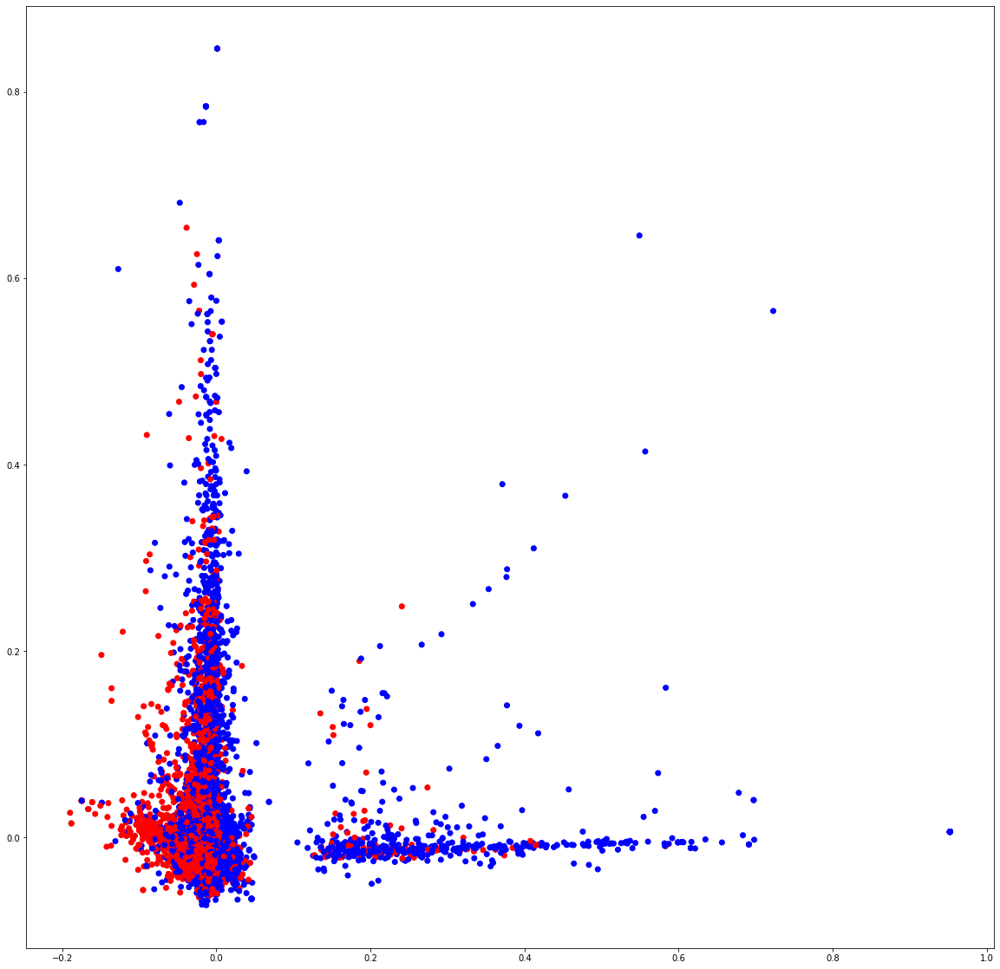

In [41]:

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt

labels_dict = {'Negative':'red', 'Neutral':'gray', 'Positive':'blue'}

def convert_labels(label):
    return labels_dict[label]

first_K_targets = shuffled_df.head(K).label.apply(lambda x: convert_labels(x))


pipeline = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
])        
X = pipeline.fit_transform(first_K_tweets).todense()

pca = PCA(n_components=2).fit(X)
data2D = pca.transform(X)
plt.figure(figsize = (20, 20))
plt.scatter(data2D[:,0], data2D[:,1], c=first_K_targets)
plt.show()

# Training

### LSTM

In [42]:
from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense, Input, Dropout
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [43]:
sequence_input = Input(shape=(30,), dtype='int32')
embedding_sequences = embedding_layer(sequence_input)
x = SpatialDropout1D(0.2)(embedding_sequences)
x = Conv1D(64, 5, activation='relu')(x)
x = Bidirectional(LSTM(64, dropout=0.2, recurrent_dropout=0.2))(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
outputs = Dense(1, activation='sigmoid')(x)
model = tf.keras.Model(sequence_input, outputs)


model.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])
ReduceLROnPlateau = ReduceLROnPlateau(factor=0.1, min_lr = 0.01, monitor = 'val_loss', verbose = 1)

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [44]:
history = model.fit(X_train, y_train, batch_size=512, epochs=10, validation_data=(X_test, y_test), callbacks=[ReduceLROnPlateau])

Epoch 1/10
2489/2489 [==============================] - 887s 354ms/step - loss: 0.5378 - accuracy: 0.7247 - val_loss: 0.4957 - val_accuracy: 0.7596
Epoch 2/10
2489/2489 [==============================] - 785s 315ms/step - loss: 0.4859 - accuracy: 0.7636 - val_loss: 0.4719 - val_accuracy: 0.7746
Epoch 3/10
2489/2489 [==============================] - 920s 369ms/step - loss: 0.4737 - accuracy: 0.7724 - val_loss: 0.4623 - val_accuracy: 0.7788
Epoch 4/10
2489/2489 [==============================] - 861s 346ms/step - loss: 0.4674 - accuracy: 0.7759 - val_loss: 0.4655 - val_accuracy: 0.7789
Epoch 5/10
2489/2489 [==============================] - 828s 333ms/step - loss: 0.4612 - accuracy: 0.7797 - val_loss: 0.4603 - val_accuracy: 0.7797
Epoch 6/10
2489/2489 [==============================] - 770s 309ms/step - loss: 0.4589 - accuracy: 0.7818 - val_loss: 0.4557 - val_accuracy: 0.7830
Epoch 7/10
2489/2489 [==============================] - 740s 297ms/step - loss: 0.4563 - accuracy: 0.7830 - val_

In [45]:
model.save('models/lstm_model.h5')

In [46]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense, Input, Dropout
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
import tensorflow as tf

load_model = tf.keras.models.load_model('models/lstm_model.h5')

# Check its architecture
load_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 30)]              0         
_________________________________________________________________
embedding (Embedding)        (None, 30, 300)           87137400  
_________________________________________________________________
spatial_dropout1d (SpatialDr (None, 30, 300)           0         
_________________________________________________________________
conv1d (Conv1D)              (None, 26, 64)            96064     
_________________________________________________________________
bidirectional (Bidirectional (None, 128)               66048     
_________________________________________________________________
dense (Dense)                (None, 512)               66048     
_________________________________________________________________
dropout (Dropout)            (None, 512)               0     

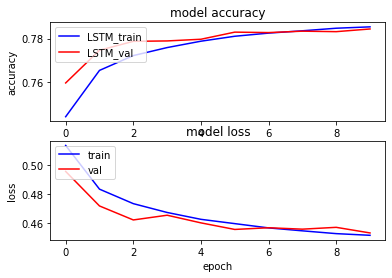

In [58]:
import matplotlib.pyplot as plt

plt1, (plt2, plt3) = plt.subplots(2,1)
plt2.plot(history.history['accuracy'], c= 'blue')
plt2.plot(history.history['val_accuracy'], c='red')
plt2.set_title('model accuracy')
plt2.set_ylabel('accuracy')
plt2.set_xlabel('epoch')
plt2.legend(['LSTM_train', 'LSTM_val'], loc='upper left')

plt3.plot(history.history['loss'], c='blue')
plt3.plot(history.history['val_loss'], c='red')
plt3.set_title('model loss')
plt3.set_ylabel('loss')
plt3.set_xlabel('epoch')
plt3.legend(['train', 'val'], loc='upper left')

In [59]:
def decode_labels(score):
    return "Positive" if score > 0.5 else "Negative"


scores = model.predict(X_test, verbose=1, batch_size=10000)
y_pred = [decode_labels(score) for score in scores]

32/32 [==============================] - 24s 746ms/step


### Confusion Matrix

[[125526  33967]
 [ 34675 124298]]


<AxesSubplot:>

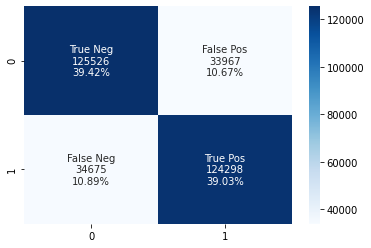

In [55]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns

#Get the confusion matrix
cf_matrix = confusion_matrix(test_data.label.to_list(), y_pred)
print(cf_matrix)


#sns.heatmap(cf_matrix, annot=True)
#sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, fmt='.2%', cmap='Blues')
labels = ['True Neg','False Pos','False Neg','True Pos']
labels = np.asarray(labels).reshape(2,2)
#sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')

In [56]:
print(classification_report(list(test_data.label), y_pred))

              precision    recall  f1-score   support

    Negative       0.78      0.79      0.79    159493
    Positive       0.79      0.78      0.78    158973

    accuracy                           0.78    318466
   macro avg       0.78      0.78      0.78    318466
weighted avg       0.78      0.78      0.78    318466

